## Введение Проект "Маркетинг"

 <div style="border:solid steelblue 3px; padding: 20px">
<font size="4"> <b> Проект "Маркетинг"</b></font>
     
<font size="3"> <b> Цель работы - Предсказать вероятность покупки в течение 90 дней </b></font>
<br /> <b> Описание </b></font>
<br />Интернет-магазин собирает историю покупателей, проводит рассылки предложений и
планирует будущие продажи. Для оптимизации процессов надо выделить пользователей,
которые готовы совершить покупку в ближайшее время.
<br /> <b> План работы </b></font>
<br />● Обзор данных
<br />● Предобработка данных
<br />● Исследовательский анализ данных  
<br />● Разработатка полезных признаков
<br />● Корреляционный анализ признаков   
<br />● Создание моделей для классификации пользователей, их улучшение, максимизация метрики ROC AUC
<br />● Значимость признаков
<br />● Выполнить тестирование
     
<br /> <b> Описание данных </b></font>

<br />apparel-purchases
<br />история покупок
Данные о покупках клиентов по дням и по товарам. В каждой записи покупка
определенного товара, его цена, количество штук.
<br />● client_id идентификатор пользователя
<br />● quantity количество товаров в заказе
<br />● price цена товара
<br />● category_ids вложенные категории, к которым отнсится товар
<br />● date дата покупки
<br />● message_id идентификатор сообщения из рассылки

<br />apparel-messages
<br />история рекламных рассылок
Рассылки, которые были отправлены клиентам из таблицы покупок.
<br />● bulk_campaign_id идентификатор рекламной кампании
<br />● client_id идентификатор пользователя
<br />● message_id идентификатор сообщений
<br />● event тип действия
<br />● channel канал рассылки
<br />● date дата рассылки
<br />● created_at точное время создания сообщения

<br />apparel-target_binary
<br />совершит ли клиент покупку в течение следующих 90 дней
<br />● client_id идентификатор пользователя
<br />● target целевой признак

<br />full_campaign_daily_event
<br />Агрегация общей базы рассылок по дням и типам событий
<br />● date дата
<br />● bulk_campaign_id идентификатор рассылки
<br />● count_event* общее количество каждого события event
<br />● nunique_event* количество уникальных client_id в каждом событии


<br />full_campaign_daily_event_channel
<br />Агрегация по дням с учетом событий и каналов рассылки
<br />● date дата
<br />● bulk_campaign_id идентификатор рассылки
<br />● count_event*_channel* общее количество каждого события по каналам
<br />● nunique_event*_channel* количество уникальных client_id по событиям и каналам


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import datetime as dt
from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.preprocessing import  StandardScaler, MinMaxScaler
from sklearn.metrics import roc_auc_score, make_scorer, accuracy_score, roc_curve
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV 
from sklearn.pipeline import Pipeline
import warnings
import catboost 
from catboost import CatBoostClassifier
from catboost import cv
from catboost import Pool
import lightgbm
from lightgbm import LGBMClassifier
import phik
import shap
import optuna
from optuna.integration import OptunaSearchCV
from optuna import distributions
from sklearn.dummy import DummyClassifier
from sklearn.impute import KNNImputer
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
RANDOM_STATE = 42

## Обзор данных

In [2]:
df_purchases = pd.read_csv('apparel-purchases.csv')
df_message =  pd.read_csv('apparel-messages.csv')

In [3]:
df_target =  pd.read_csv('apparel-target_binary.csv', index_col = 0)

In [4]:
df__daily_event =  pd.read_csv('full_campaign_daily_event.csv')

In [5]:
df__daily_event_f =  pd.read_csv('full_campaign_daily_event_channel.csv')

In [6]:
df_message.duplicated().sum()

48610

In [7]:
def data_describe(df):
    print("Случайные строки датасета")
    print(df.sample(5))
    print()
    print("Информация о столбцах датасета")
    print(df.info())
    print()
    print("Статистика числовых данных датасета")
    print(df.describe())
    print()
    print("Информация о пропущенных значениях")
    print(df.isna().sum())
    print()
    print("Информация о дубликатах")
    dups = df.duplicated().sum()
    print(dups)
    print("Процент дубликатов, %")
    print(dups* 100/df.shape[0])
    dupsi = df.index.duplicated().sum()
    print("Информация о дубликатах индексов ")
    print(dupsi)
    print("Процент дубликатов индексов, %")
    print(dupsi*100/df.shape[0])
    print()
    cat_feat = df.select_dtypes('object').columns.tolist()
    for i in cat_feat:
        if df[i].value_counts().shape[0] < 30:
            print("Количество уникальных значений")
            print(df[i].value_counts().head(15))
            print()

In [8]:
data_describe(df_message)

Случайные строки датасета
         bulk_campaign_id            client_id  \
695851               5335  1515915625489939753   
2718969              8120  1515915625489806826   
9789242             14216  1515915625487701563   
7067772             13683  1515915625490434648   
5124180             12685  1515915625487682551   

                                      message_id  event      channel  \
695851    1515915625489939753-5335-62c7d2c574dd3  click        email   
2718969   1515915625489806826-8120-6380610ca92c4   send        email   
9789242  1515915625487701563-14216-65683e14040d6   send        email   
7067772  1515915625490434648-13683-64df391378d67   open        email   
5124180  1515915625487682551-12685-64663e91ed4b0   send  mobile_push   

               date           created_at  
695851   2022-07-09  2022-07-09 11:35:34  
2718969  2022-11-25  2022-11-25 06:48:29  
9789242  2023-11-30  2023-11-30 07:50:53  
7067772  2023-08-18  2023-08-18 09:35:59  
5124180  2023-05-18  2023

<div style="border:solid steelblue 3px; padding: 20px">
Требуется изменение типа данных дата и время создания из типа object в тип datetime
Так как количество дублей менее 0.5% и дубли включают одинаковое время создание завписей вплодь до секунды, считаем дубли истинными и удалим их в предобработке данных. 

In [9]:
data_describe(df_purchases)

Случайные строки датасета
                  client_id  quantity   price  \
67114   1515915625584694118         1   559.0   
108396  1515915625631320245         1   392.0   
5300    1515915625499989529         1   599.0   
138972  1515915625487214460         1  1750.0   
196730  1515915625588050715         1  2759.0   

                            category_ids        date  \
67114   ['6060', '6058', '6067', '5498']  2022-12-16   
108396   ['5562', '5632', '5552', '855']  2023-04-21   
5300           ['4', '28', '213', '436']  2022-06-01   
138972         ['2', '18', '212', '726']  2023-06-14   
196730         ['2', '18', '212', '658']  2024-01-24   

                                     message_id  
67114    1515915625567838494-8722-639c183a5fd6d  
108396  1515915625935862923-11806-6437ee73725d8  
5300     1515915625499989529-4679-62972254c1805  
138972  1515915625487214460-13342-648965b29b670  
196730  1515915625588050715-14521-65af8eb7167f5  

Информация о столбцах датасета
<class 'pa

<div style="border:solid steelblue 3px; padding: 20px">
Требуется изменение типа данных дата  из типа object в тип datetime.
Видим минимальную стоимость товара в 1, но нигде в описании не указано, это будет рубль или условная единица, поэтому не будем фильтровать это значение.
Так как количество дублей около 36% мы не должны считать данные дубликаты истинными дубликатами.
Скорее всего эти дубли связаны с работой интернет магазина и относятся к отдельным товарам, например другого цвета либо логика работы может быть следующей - покупатель может хранить в почте или в мобильном телефоне ссылку и покупать один и тот же товар кликая на одну и ту же ссылку, в связи с чем message -id и возможно остальные данные с ним связанные, например время, будут одинаковые поэтому не будем их удалять в предобработке данных.

In [10]:
data_describe(df_target)

Случайные строки датасета
                     target
client_id                  
1515915625470788958       0
1515915625555739813       0
1515915625867471994       0
1515915625579090241       0
1515915625976017754       0

Информация о столбцах датасета
<class 'pandas.core.frame.DataFrame'>
Index: 49849 entries, 1515915625468060902 to 1515915626010443624
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   target  49849 non-null  int64
dtypes: int64(1)
memory usage: 778.9 KB
None

Статистика числовых данных датасета
             target
count  49849.000000
mean       0.019278
std        0.137503
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000

Информация о пропущенных значениях
target    0
dtype: int64

Информация о дубликатах
49847
Процент дубликатов, %
99.99598788340789
Информация о дубликатах индексов 
0
Процент дубликатов индексов, %
0.0



<div style="border:solid steelblue 3px; padding: 20px">
Дубликатов в индексах целевого датасета нет

In [11]:
data_describe(df__daily_event)

Случайные строки датасета
              date  bulk_campaign_id  count_click  count_complain  \
41812   2022-12-13              6803            0               0   
57323   2023-02-13              7535            0               0   
39964   2022-12-06              2367            0               0   
95409   2023-12-08             14178            1               0   
117107  2024-03-19             14812          143               0   

        count_hard_bounce  count_open  count_purchase  count_send  \
41812                   0           3               0           0   
57323                   0           5               0           0   
39964                   0           3               0           0   
95409                   0          10               0           0   
117107                  0           2               1           0   

        count_soft_bounce  count_subscribe  count_unsubscribe  nunique_click  \
41812                   0                0                  0   

In [12]:
data_describe(df__daily_event_f)

Случайные строки датасета
              date  bulk_campaign_id  count_click_email  \
89454   2023-10-17              5707                  1   
39173   2022-12-02              7900                  1   
101516  2024-01-09             14303                  0   
101371  2024-01-08             14402                  0   
71117   2023-05-02              7534                  0   

        count_click_mobile_push  count_open_email  count_open_mobile_push  \
89454                         0                 0                       0   
39173                         0                14                       0   
101516                        5                 0                       0   
101371                        1                 0                       0   
71117                         0                 6                       0   

        count_purchase_email  count_purchase_mobile_push  \
89454                      0                           0   
39173                      0        

<div style="border:solid steelblue 3px; padding: 20px">
Дубликатов в агрегированных датасетах не найдено

## Предобработка данных 

<div style="border:solid steelblue 3px; padding: 20px">
Поменяем тип данных в столбцах data и created_at на datetime
Добавим также информацию о месяце и годе в датасеты

In [13]:
df_message['created_at'] = df_message['created_at'].astype("datetime64[ns]")
df_purchases['date'] = pd.to_datetime(df_purchases['date'], format='%Y-%m-%d')
df_message['date'] = pd.to_datetime(df_purchases['date'], format='%Y-%m-%d')
df__daily_event_f['date'] = pd.to_datetime(df__daily_event_f['date'], format='%Y-%m-%d')
df_purchases['year'] = df_purchases['date'].dt.year
df_purchases['month'] = df_purchases['date'].dt.month
df__daily_event_f['year'] = df__daily_event_f['date'].dt.year
df__daily_event_f['month'] = df__daily_event_f['date'].dt.month
df_message['year'] = df_message['created_at'].dt.year
df_message['month'] = df_message['created_at'].dt.month
df_message['year_d'] = df_message['date'].dt.year
df_message['month_d'] = df_message['date'].dt.month
df_message[['year','month']] = df_message[['year','month']].astype('Int64')

<div style="border:solid steelblue 3px; padding: 20px">
добавим новый столбец по стоимости покупок

In [14]:
df_purchases['total_cost'] = df_purchases['quantity'] * df_purchases['price']

<div style="border:solid steelblue 3px; padding: 20px">
Удалим дубликаты

In [15]:
df_message = df_message.drop_duplicates()

## Исследовательский анализ данных

In [16]:
df_message_d = df_message.pivot_table(index= ['year','month'],columns= ['event','channel']
                                      , values = ['message_id'], aggfunc = 'count' )
df__daily_event_f_piv = df__daily_event_f.pivot_table(index= ['year','month'], values = ['count_send_email',
                                                'count_send_mobile_push','count_click_email',
                                                'count_click_mobile_push','count_open_email','count_open_mobile_push',
                                                'count_purchase_email','count_purchase_mobile_push'], aggfunc = 'sum' )


df_purchases_piv_d = df_purchases.pivot_table(index= ['year','month'], values = [
                                                'quantity', 'total_cost' ], aggfunc = {'quantity':'count', 'total_cost':'sum'} )

df_message_d.columns = df_message_d.columns.droplevel(0)
df_message_d.columns = ['_'.join(map(str, c)).strip('_') for c in df_message_d]
df_message_d['conversion_email'] = df_message_d['purchase_email']/ df_message_d['open_email']
df_message_d['conversion_mobile_push'] = df_message_d['purchase_mobile_push']/ df_message_d['open_mobile_push']
df_message_d['concernment_email'] = df_message_d['open_email']/ df_message_d['send_email']
df_message_d['concernment_mobile_push'] = df_message_d['open_mobile_push']/ df_message_d['send_mobile_push']
df_message_d['desire_email'] = df_message_d['click_email']/ df_message_d['open_email']
df_message_d['desire_mobile_push'] = df_message_d['click_mobile_push']/ df_message_d['open_mobile_push']

df__daily_event_f_piv['conversion_email'] = df__daily_event_f_piv['count_purchase_email']/ df__daily_event_f_piv['count_open_email']
df__daily_event_f_piv['conversion_mobile_push'] = df__daily_event_f_piv['count_purchase_mobile_push']/ df__daily_event_f_piv['count_open_mobile_push']
df__daily_event_f_piv['concernment_email'] = df__daily_event_f_piv['count_open_email']/ df__daily_event_f_piv['count_send_email']
df__daily_event_f_piv['concernment_mobile_push'] = df__daily_event_f_piv['count_open_mobile_push']/ df__daily_event_f_piv['count_send_mobile_push']
df__daily_event_f_piv['desire_email'] = df__daily_event_f_piv['count_click_email']/ df__daily_event_f_piv['count_open_email']
df__daily_event_f_piv['desire_mobile_push'] = df__daily_event_f_piv['count_click_mobile_push']/ df__daily_event_f_piv['count_open_mobile_push']


Посмотрим на распределение стоимости покупок

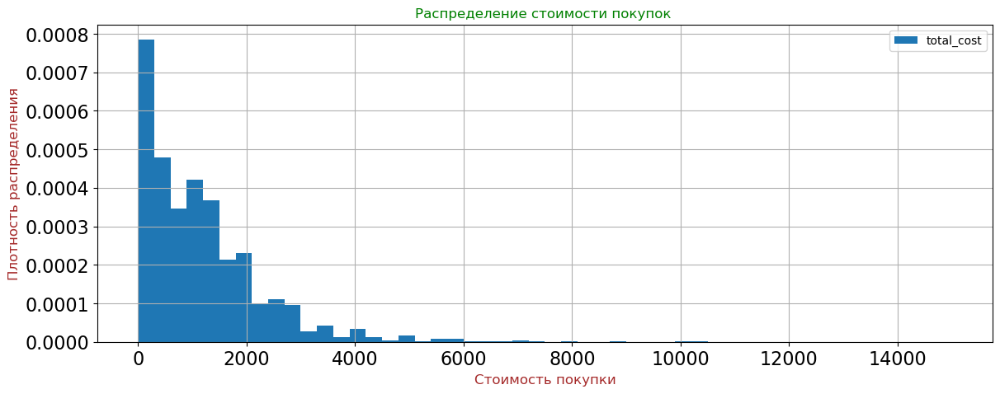

In [17]:
ax =( df_purchases.query(' total_cost < 15000')['total_cost']
     .plot(kind = 'hist', density=True, figsize = (14,5),bins = 50, fontsize = 16, legend = True)
);
ax.grid()
ax.set_xlabel("Стоимость покупки",fontsize = 12, color = 'Brown')
ax.set_ylabel("Плотность распределения",fontsize = 12, color = 'Brown')
ax.set_title("Распределение стоимости покупок ",fontsize = 12, color = 'Green' );

In [18]:
df_purchases['total_cost'].describe()

count    202208.000000
mean       1199.480288
std        1355.024588
min           1.000000
25%         355.000000
50%         997.000000
75%        1699.000000
max       85499.000000
Name: total_cost, dtype: float64

<div style="border:solid steelblue 3px; padding: 20px">
Видим экспоненциально убывающее распределение стоимости покупок, основное количество стоимости покупок находится в пределах до 2000 (неизвестных из описания величин)

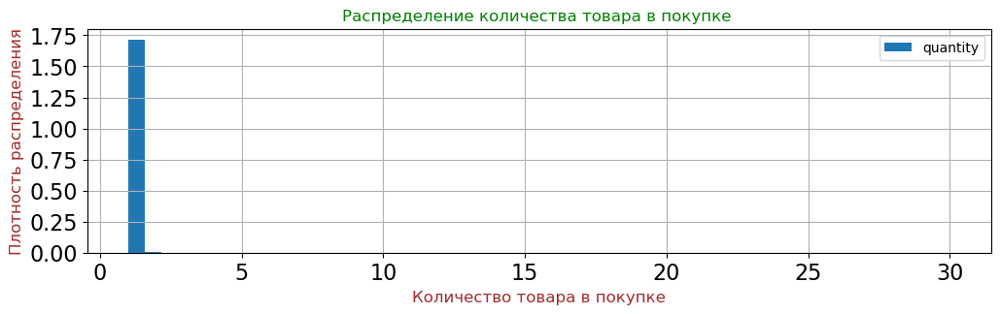

In [19]:
ax =( df_purchases['quantity']
     .plot(kind = 'hist', density=True, figsize = (12,3),bins = 50, fontsize = 16, legend = True)
);
ax.grid()
ax.set_xlabel("Количество товара в покупке",fontsize = 12, color = 'Brown')
ax.set_ylabel("Плотность распределения",fontsize = 12, color = 'Brown')
ax.set_title("Распределение количества товара в покупке ",fontsize = 12, color = 'Green' );

<div style="border:solid steelblue 3px; padding: 20px">
В основном количество покупок равно одной единице. Это может быть связано с тем что при покупке нескольких товаров формируется несколько сообщений.

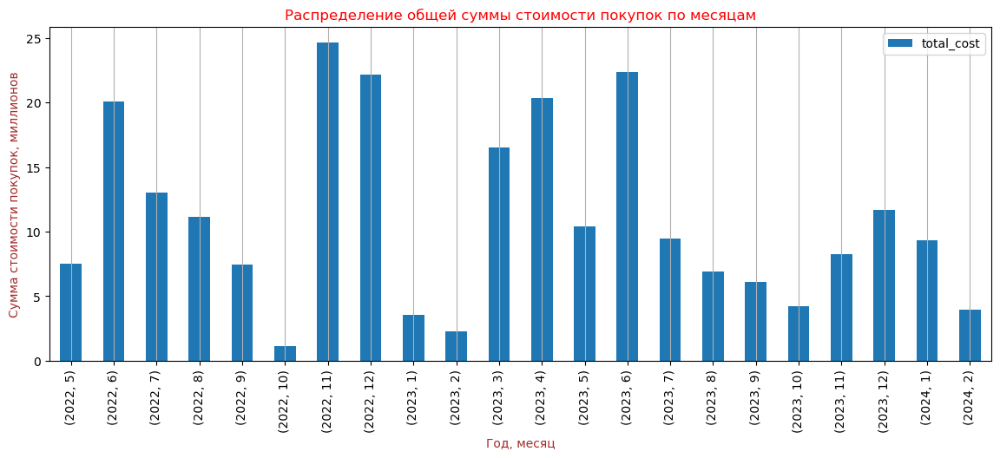

In [20]:
ax =( (df_purchases_piv_d['total_cost']/1000000)
     .plot(kind = 'bar', figsize = (14,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Сумма стоимости покупок, миллионов",fontsize = 10, color = 'Brown')
ax.set_title("Распределение общей суммы стоимости покупок по месяцам",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Сумма стоимости покупок с некоторой периодичностью распределена по месяцам, самая маленькая в октябре.Также видны значительные колебания суммы стоимости покупок от месяца

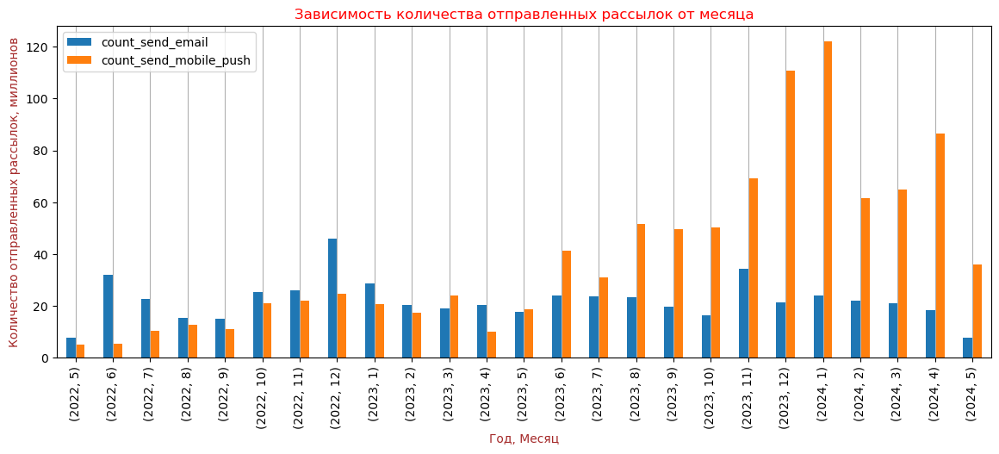

In [21]:
ax =( (df__daily_event_f_piv[['count_send_email','count_send_mobile_push']]/1000000)
     .plot(kind = 'bar', figsize = (14,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, Месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество отправленных рассылок, миллионов",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость количества отправленных рассылок от месяца",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Как видно из графика, количество отправленых через мобильный телефон рассылок увеличилось с середины 2023г, по электронной почте не изменилось.

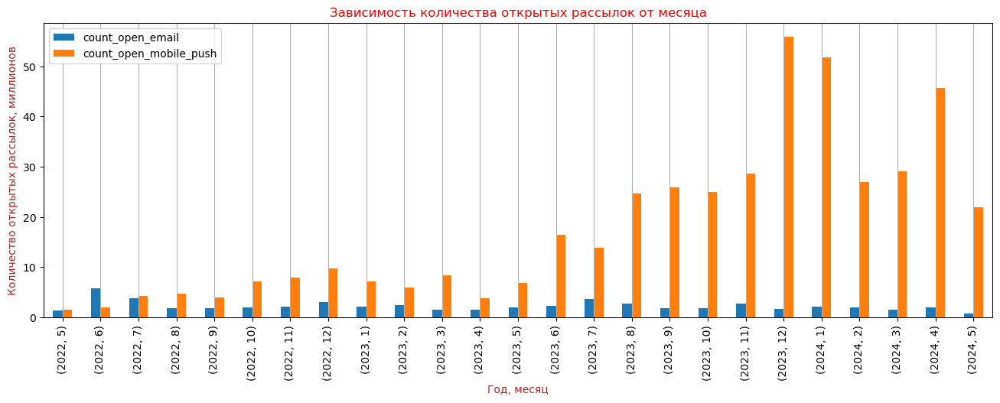

In [22]:
ax =( (df__daily_event_f_piv[['count_open_email','count_open_mobile_push']]/1000000)
     .plot(kind = 'bar', figsize = (16,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество открытых рассылок, миллионов",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость количества открытых рассылок от месяца",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Из графика видно, что количество открытых через телефон рассылок увеличилось с середины 2023г, по электронной почте с начала 2024г началось уменьшаться

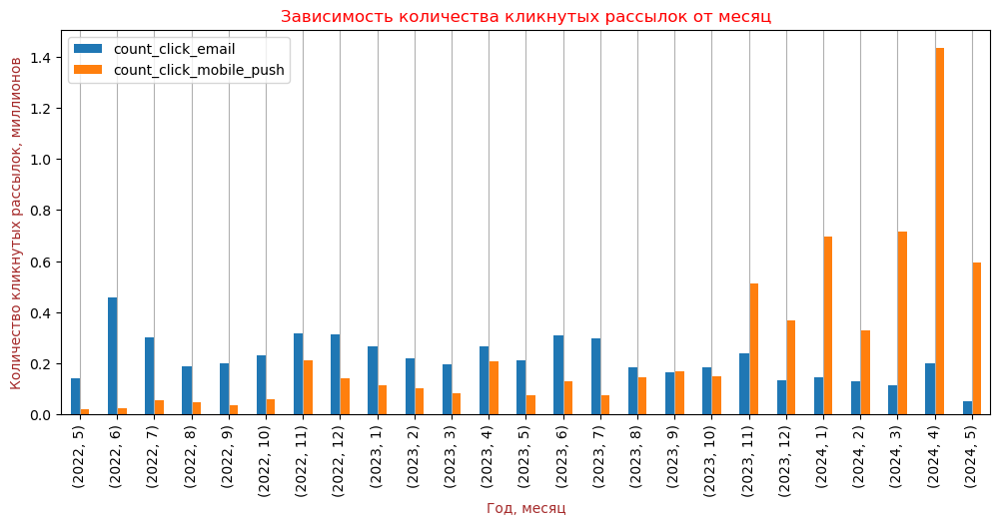

In [23]:
ax =( (df__daily_event_f_piv[['count_click_email','count_click_mobile_push']]/1000000)
     .plot(kind = 'bar', figsize = (12,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество кликнутых рассылок, миллионов",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость количества кликнутых рассылок от месяц",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Количество кликнутых рассылок резко выросло с конца 2023г

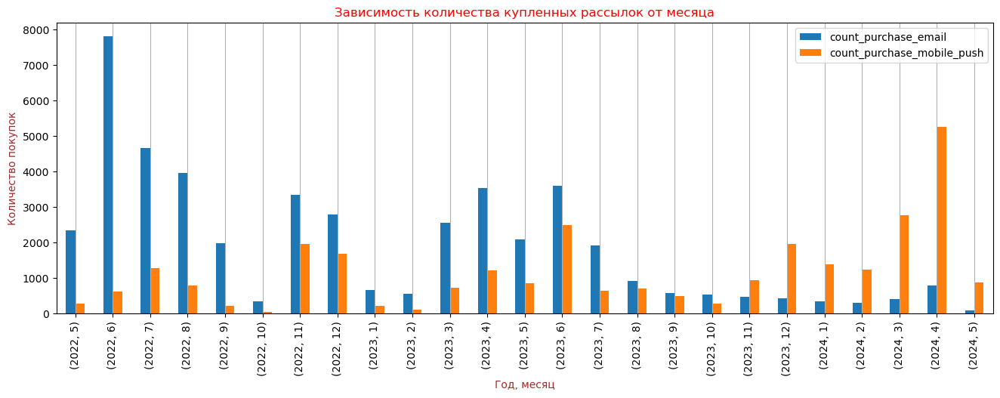

In [24]:
ax =( df__daily_event_f_piv[['count_purchase_email','count_purchase_mobile_push']]
     .plot(kind = 'bar', figsize = (16,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество покупок",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость количества купленных рассылок от месяца",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Видим уменьшение количества покупок для канала электронной почты и увеличение покупок для канала мобильных уведомлений

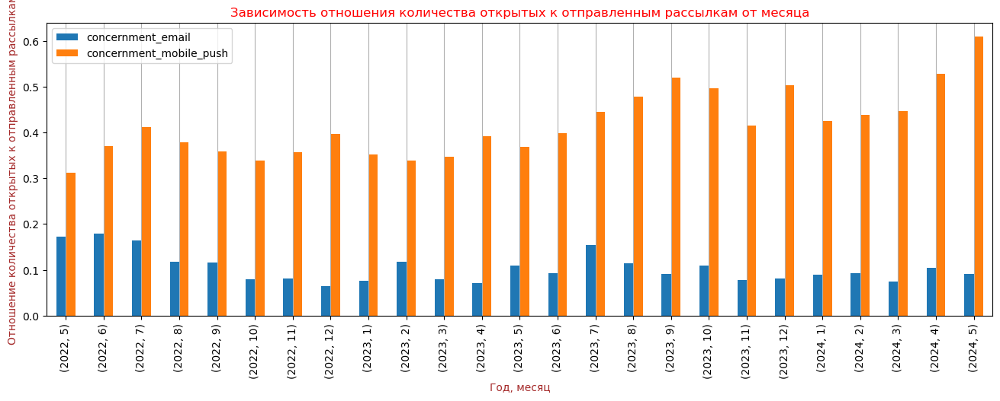

In [25]:
ax =( df__daily_event_f_piv[['concernment_email','concernment_mobile_push']]
     .plot(kind = 'bar', figsize = (16,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Отношение количества открытых к отправленным рассылкам",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость отношения количества открытых к отправленным рассылкам от месяца",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Видим небольшой рост отношения количества открытых к отправленным рассылкам для мобильных уведомлений и снижение для рассылок по электронной почте

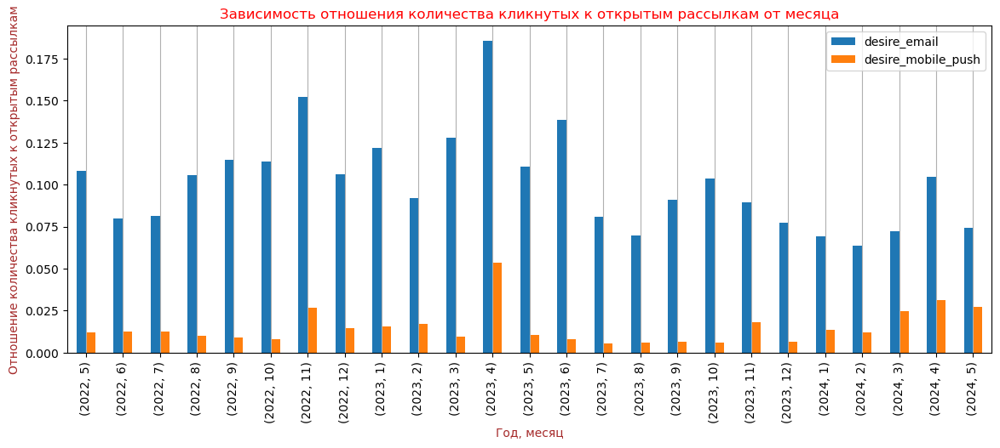

In [26]:
ax =( df__daily_event_f_piv[['desire_email','desire_mobile_push']]
#ax =( df_message_d['desire_mobile_push']
     .plot(kind = 'bar', figsize = (14,5),rot = 90, legend = True, fontsize = 10)
);
ax.xaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Отношение количества кликнутых к открытым рассылкам",fontsize = 10, color = 'Brown')
ax.set_title("Зависимость отношения количества кликнутых к открытым рассылкам от месяца",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Видно снижение количества кликнутых к открытым посылкам для канала электронной почты и рост для канала мобильных уведомлений.

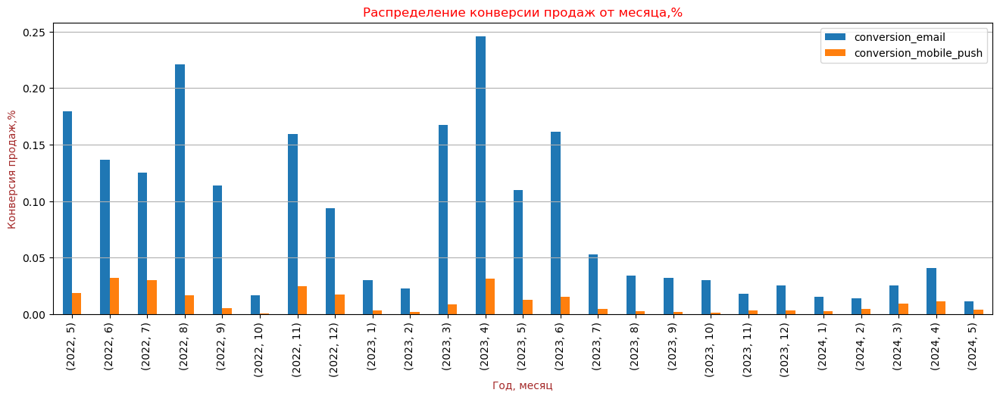

In [27]:
ax =((df__daily_event_f_piv[['conversion_email','conversion_mobile_push']]*100)
     .plot(kind = 'bar', figsize = (16,5),rot = 90, legend = True, fontsize = 10)
);
ax.yaxis.grid()
ax.set_xlabel("Год, месяц",fontsize = 10, color = 'Brown')
ax.set_ylabel("Конверсия продаж,%",fontsize = 10, color = 'Brown')
ax.set_title("Распределение конверсии продаж от месяца,%",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Видим резкое снижение конверсии продаж со всех каналов с августа 2023г, данное уменьшение может быть связано со слишком высокой и необеспеченной маркетинговой активностью

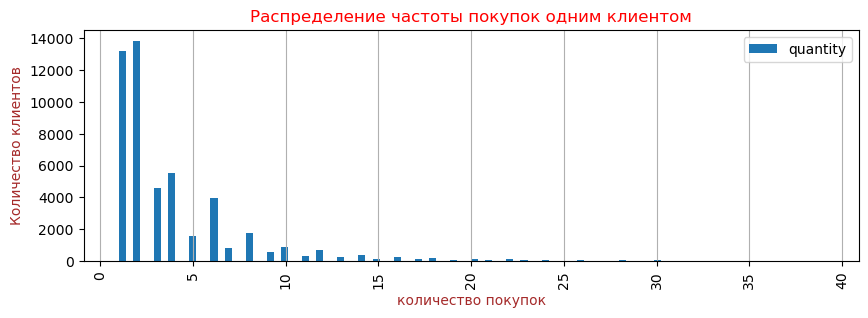

In [28]:
df_purchases_p = df_purchases.pivot_table(index= 'client_id', values = ['quantity'], aggfunc = 'count' )
ax =( df_purchases
     .pivot_table(index= 'client_id', values = ['quantity'], aggfunc = 'count' ).sort_values(by='quantity').head(len(df_purchases_p)- 150)     
     .plot(kind = 'hist',bins = 100, figsize = (10,3),rot = 90, legend = True, fontsize = 10)
);
ax.grid(axis='x')
#ax.grid(axis='y')
ax.set_xlabel("количество покупок",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество клиентов",fontsize = 10, color = 'Brown')
ax.set_title("Распределение частоты покупок одним клиентом",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
Видно что распределение количества покупок имеет вид убывающей экспоненты. 
Посмотрим на идентификаторы рассылок, которые больше всего влияют на покупки   

/tmp/ipykernel_548867/2926522673.py:2: FutureWarning: The provided callable <function sum at 0x7cf8605ab100> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  .groupby('bulk_campaign_id').aggregate(np.sum).sort_values(by='count_purchase',ascending=False).head(50)


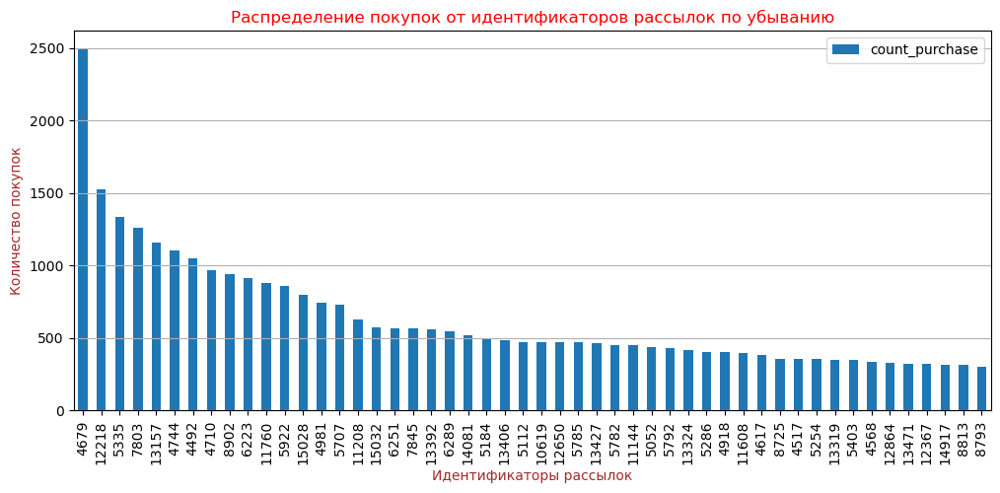

In [29]:
ax =( df__daily_event[['bulk_campaign_id','count_purchase']]
     .groupby('bulk_campaign_id').aggregate(np.sum).sort_values(by='count_purchase',ascending=False).head(50)
     .plot(kind = 'bar', figsize = (12,5),rot = 90, legend = True, fontsize = 10)
);
ax.yaxis.grid()
ax.set_xlabel("Идентификаторы рассылок",fontsize = 10, color = 'Brown')
ax.set_ylabel("Количество покупок",fontsize = 10, color = 'Brown')
ax.set_title("Распределение покупок от идентификаторов рассылок по убыванию",fontsize = 12, color = 'Red' );

<div style="border:solid steelblue 3px; padding: 20px">
С большим отрывом лидирует рассылка 4679,которая имеет 2500 покупок ,около 22 рассылок имеют по более 500 покупок, 7 рассылок имеют более 1000 покупок

## Разработатка полезных признаков

Посмотрим на возможность разделения message_id на client_id и bulk_campaign_id 

In [30]:
df_purchases_custom = df_purchases['message_id'].str.split("-", expand = True).add_prefix('message_id_')
df_purchases_custom.sample(10)

,message_id_0,message_id_1,message_id_2
78478,1515915625491059895,8995,63a5b12587bba
47213,1515915625582494167,7737,636c9e0801ab0
80207,1515915625503164711,9133,63ada0fa2ae72
181058,1515915625864692062,14219,65684494127a8
94536,1515915625851458404,11144,641ad290875a0
4646,1515915625471356416,4679,6297224eecd64
30802,1515915625543113006,5840,62f34d06d8751
175758,1515915625572105023,14073,654b439a77abc
196305,1515915625489771425,14524,65af729bcadac
90614,1515915625489002116,10671,6405d28f2ba13


In [31]:
df_purchases_custom = pd.merge(df_purchases, df_purchases_custom,  left_index=True, right_index=True, how='outer', sort=False)
df_purchases_custom['message_id_0'] = df_purchases_custom['message_id_0'].astype('int64')
df_purchases_custom.sample(5)

,client_id,quantity,price,category_ids,date,message_id,year,month,total_cost,message_id_0,message_id_1,message_id_2
146518,1515915625501114771,1,293.0,"['2', '17', '180', '465']",2023-06-27,1515915625764188155-13406-649aaf1572e60,2023,6,293.0,1515915625764188155,13406,649aaf1572e60
20472,1515915625489846325,1,1299.0,"['4', '28', '244', '432']",2022-07-07,1515915625489846325-5286-62c52c073fd2e,2022,7,1299.0,1515915625489846325,5286,62c52c073fd2e
78233,1515915625693678808,1,69.0,"['4', '27', '287', '546']",2022-12-24,1515915625693678808-8995-63a5b13a56550,2022,12,69.0,1515915625693678808,8995,63a5b13a56550
158733,1515915625973822981,1,1199.0,"['4', '31', '324', '5813']",2023-07-12,1515915625973822981-13485-64aec01f896f9,2023,7,1199.0,1515915625973822981,13485,64aec01f896f9
63896,1515915625544288903,1,104.0,"['6060', '6058', '6065', '1848']",2022-12-14,1515915625637155296-8663-6399c91e5ec6f,2022,12,104.0,1515915625637155296,8663,6399c91e5ec6f


In [32]:
df_purchases_custom.query('client_id != message_id_0').info()

<class 'pandas.core.frame.DataFrame'>
Index: 55683 entries, 28 to 202207
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   client_id     55683 non-null  int64         
 1   quantity      55683 non-null  int64         
 2   price         55683 non-null  float64       
 3   category_ids  55683 non-null  object        
 4   date          55683 non-null  datetime64[ns]
 5   message_id    55683 non-null  object        
 6   year          55683 non-null  int32         
 7   month         55683 non-null  int32         
 8   total_cost    55683 non-null  float64       
 9   message_id_0  55683 non-null  int64         
 10  message_id_1  55683 non-null  object        
 11  message_id_2  55683 non-null  object        
dtypes: datetime64[ns](1), float64(2), int32(2), int64(3), object(4)
memory usage: 5.1+ MB


In [33]:
df_purchases_custom.query('client_id == message_id_0').info()

<class 'pandas.core.frame.DataFrame'>
Index: 146525 entries, 0 to 202203
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   client_id     146525 non-null  int64         
 1   quantity      146525 non-null  int64         
 2   price         146525 non-null  float64       
 3   category_ids  146525 non-null  object        
 4   date          146525 non-null  datetime64[ns]
 5   message_id    146525 non-null  object        
 6   year          146525 non-null  int32         
 7   month         146525 non-null  int32         
 8   total_cost    146525 non-null  float64       
 9   message_id_0  146525 non-null  int64         
 10  message_id_1  146525 non-null  object        
 11  message_id_2  146525 non-null  object        
dtypes: datetime64[ns](1), float64(2), int32(2), int64(3), object(4)
memory usage: 13.4+ MB


<div style="border:solid steelblue 3px; padding: 20px">
Как видим, нет возможности разделить message_id на client_id и bulk_campaign_id, так как около трети message_id не включают в себя client_id и bulk_campaign_id. 

<div style="border:solid steelblue 3px; padding: 20px">
Упростим и разделим category_ids на составные частей в форме чисел, предварительно убрав скобки и кавычки

In [34]:
df_purchases['category_ids'] = df_purchases['category_ids'].replace('', np.nan )
df_purchases['category_ids'] = df_purchases['category_ids'].str.replace(r'\s+', '0')
df_purchases['category_ids'] = df_purchases['category_ids'].fillna('0')
df_purchases['category_ids'] = df_purchases['category_ids'].replace('None', np.nan)
df_purchases['category_ids'] = df_purchases['category_ids'].str.replace('[','')
df_purchases['category_ids'] = df_purchases['category_ids'].str.replace(']','')
df_purchases['category_ids'] = df_purchases['category_ids'].str.replace("'",'')
df_purchases['category_ids'] = df_purchases['category_ids'].str.replace(" ",'')
df_cut = df_purchases['category_ids'].str.split(",", expand = True).add_prefix('cat_')
df_purchases = pd.merge(df_purchases, df_cut,  left_index=True, right_index=True, how='left', sort=False)
df_purchases = df_purchases.drop( 'category_ids', axis =1)
df_purchases['cat_0'] = df_purchases['cat_0'].replace('', np.nan )
df_purchases['cat_0'] = df_purchases['cat_0'].replace('None', np.nan)
df_purchases['cat_0'] = df_purchases['cat_0'].fillna('0')
df_purchases['cat_1'] = df_purchases['cat_1'].fillna('0')
df_purchases['cat_2'] = df_purchases['cat_2'].fillna('0')
df_purchases['cat_3'] = df_purchases['cat_3'].fillna('0')
df_purchases['cat_4'] = df_purchases['cat_4'].fillna('0')
df_purchases.sample(5)

,client_id,quantity,price,date,message_id,year,month,total_cost,cat_0,cat_1,cat_2,cat_3,cat_4
183245,1515915625684537510,1,2073.0,2023-12-20,1515915625684537510-14339-65814de2ea404,2023,12,2073.0,2,18,274,446,0
161331,1515915625559988454,1,1332.0,2023-08-04,1515915625559988454-13591-64ccb5eb76e86,2023,8,1332.0,2,18,344,445,0
158074,1515915625576859403,1,999.0,2023-07-12,1515915625489235975-13478-64ae7239e4b04,2023,7,999.0,4,28,275,421,0
42975,1515915625476359607,1,179.0,2022-11-10,1515915625476359607-7687-636b572648c05,2022,11,179.0,5562,5589,5576,1681,0
59100,1515915625868188786,1,1299.0,2022-11-16,1515915625689438848-7879-6374876902134,2022,11,1299.0,4,27,84,515,0


In [35]:
df_purchases.query('cat_0 == "None"')

,client_id,quantity,price,date,message_id,year,month,total_cost,cat_0,cat_1,cat_2,cat_3,cat_4


In [36]:
df_message['bulk_campaign_id'] = df_message['bulk_campaign_id'].astype('str')

In [37]:
df_message.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12691188 entries, 0 to 12739797
Data columns (total 11 columns):
 #   Column            Dtype         
---  ------            -----         
 0   bulk_campaign_id  object        
 1   client_id         int64         
 2   message_id        object        
 3   event             object        
 4   channel           object        
 5   date              datetime64[ns]
 6   created_at        datetime64[ns]
 7   year              Int64         
 8   month             Int64         
 9   year_d            float64       
 10  month_d           float64       
dtypes: Int64(2), datetime64[ns](2), float64(2), int64(1), object(4)
memory usage: 1.2+ GB


In [38]:
df_message['bulk_campaign_id'].nunique()

2709

<div style="border:solid steelblue 3px; padding: 20px">
Создадим входные признаки из идентификаторов рассылок. Их количество 2709

In [39]:
df_message_piv = df_message.pivot_table(index= 'client_id',columns= ['bulk_campaign_id'] , values = ['event'], aggfunc = 'count' )#x.unique() )
df_message_piv.sample(5)

event                                                  \
bulk_campaign_id     1001 10020 10022 10028 10029 10036 10037 10043 10060   
client_id                                                                   
1515915625481680332   NaN   1.0   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625920786263   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN   NaN   NaN   NaN   NaN   1.0   NaN   
1515915625602297041   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   

                                                                          \
bulk_campaign_id    10061 10064 10065 10067 10070 1011 10114 10127 10129   
client_id                                                                  
1515915625481680332   NaN   NaN   NaN   NaN   NaN  NaN   NaN   NaN   NaN   
1515915625920786263   NaN   NaN   NaN   NaN   NaN  NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN   NaN   NaN  NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN   NaN   NaN  NaN   NaN   NaN   NaN   
1515915625602297041   2.0   NaN   NaN   NaN   NaN  NaN   NaN   1.0   NaN   

                                                                           \
bulk_campaign_id    10130 10145 10146 10152 10159 10179 10180 10186 10187   
client_id                                                                   
1515915625481680332   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN   NaN   
1515915625920786263   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625602297041   NaN   NaN   NaN   2.0   NaN   NaN   NaN   NaN   NaN   

                                                                          \
bulk_campaign_id    10193 10194 10195 1020 10209 10210 10218 10233 10234   
client_id                                                                  
1515915625481680332   NaN   NaN   NaN  NaN   NaN   NaN   NaN   1.0   NaN   
1515915625920786263   NaN   NaN   NaN  NaN   NaN   NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN  NaN   NaN   NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN  NaN   NaN   NaN   NaN   NaN   NaN   
1515915625602297041   NaN   NaN   NaN  NaN   NaN   NaN   NaN   NaN   NaN   

                                                                           \
bulk_campaign_id    10235 10247 10248 10256 10257 10268 10269 10270 10289   
client_id                                                                   
1515915625481680332   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   2.0   
1515915625920786263   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   1.0   
1515915625602297041   NaN   NaN   NaN   NaN   NaN   2.0   NaN   NaN   NaN   

                                                                           \
bulk_campaign_id    10308 10309 10321 10326 10329 10345 10373 10381 10382   
client_id                                                                   
1515915625481680332   NaN   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN   
1515915625920786263   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625811513307   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   
1515915625538827323   NaN   NaN   NaN   NaN   NaN   NaN   1.0   NaN   NaN   
1515915625602297041   NaN   NaN   2.0   NaN   NaN   NaN   NaN   NaN   NaN   

                                                                           \
bulk_campaign_id    10397 10400 10413 10421 10423 10424 10438 10439 10479   
client_id                                                                   
1515915625481680332   NaN   NaN   NaN   1.0   NaN   NaN   1.0   NaN   NaN   
1515915625920786263   NaN 

In [40]:
df_message_piv.columns = ['_'.join(map(str, c)).strip('_') for c in df_message_piv]

In [41]:
df_message_piv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 53329 entries, 1515915625468060902 to 1515915626010288690
Columns: 2709 entries, event_1001 to event_9993
dtypes: float64(2709)
memory usage: 1.1 GB


<div style="border:solid steelblue 3px; padding: 20px">
Создадим признаки из уникальных подкатегорий товаров с привязкой к году покупки, количеству покупок и сумме покупок

In [42]:

df_purchases_piv = df_purchases.pivot_table(index= 'client_id',columns= ['year'] , values = ['quantity', 'total_cost', 'cat_0','cat_1','cat_2',
                                                                                             'cat_3','cat_4'], aggfunc= {
    'quantity':'sum', 'total_cost':'sum', 'cat_0':lambda x:x.unique(), 'cat_1':lambda x:x.unique(), 'cat_2':lambda x:x.unique(), 
    'cat_3':lambda x:x.unique(), 'cat_4':lambda x:x.unique()}) 
df_purchases_piv=df_purchases_piv.dropna(axis=1,how='all')
df_purchases_piv= df_purchases_piv.dropna(how='all')
df_message_piv= df_message_piv.dropna(how='all')

In [43]:
df_purchases_piv.columns = ['_'.join(map(str, c)).strip('_') for c in df_purchases_piv]

In [44]:
df_purchases_piv = df_purchases_piv.fillna(0)

In [45]:
df_purchases_piv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49849 entries, 1515915625468060902 to 1515915626010443624
Data columns (total 21 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cat_0_2022       49849 non-null  object 
 1   cat_0_2023       49849 non-null  object 
 2   cat_0_2024       49849 non-null  object 
 3   cat_1_2022       49849 non-null  object 
 4   cat_1_2023       49849 non-null  object 
 5   cat_1_2024       49849 non-null  object 
 6   cat_2_2022       49849 non-null  object 
 7   cat_2_2023       49849 non-null  object 
 8   cat_2_2024       49849 non-null  object 
 9   cat_3_2022       49849 non-null  object 
 10  cat_3_2023       49849 non-null  object 
 11  cat_3_2024       49849 non-null  object 
 12  cat_4_2022       49849 non-null  object 
 13  cat_4_2023       49849 non-null  object 
 14  cat_4_2024       49849 non-null  object 
 15  quantity_2022    49849 non-null  float64
 16  quantity_2023    49849 non-null

In [46]:
df_purchases_piv.head()

,cat_0_2022,cat_0_2023,cat_0_2024,cat_1_2022,cat_1_2023,cat_1_2024,cat_2_2022,cat_2_2023,cat_2_2024,cat_3_2022,cat_3_2023,cat_3_2024,cat_4_2022,cat_4_2023,cat_4_2024,quantity_2022,quantity_2023,quantity_2024,total_cost_2022,total_cost_2023,total_cost_2024
client_id,,,,,,,,,,,,,,,,,,,,,
1515915625468060902,[4],0,0,"[27, 28]",0,0,"[176, 260, 1828, 290, 244]",0,0,"[458, 420, 1599, 422, 432]",0,0,[0],0,0,7.0,0.0,0.0,6993.0,0.0,0.0
1515915625468061003,0,[4],0,0,[28],0,0,[249],0,0,[615],0,0,[0],0,0.0,7.0,0.0,0.0,16235.0,0.0
1515915625468061099,[4],0,0,[28],0,0,[290],0,0,[424],0,0,[0],0,0,1.0,0.0,0.0,299.0,0.0,0.0
1515915625468061100,0,0,[4],0,0,[27],0,0,[1828],0,0,[5717],0,0,[0],0.0,0.0,2.0,0.0,0.0,2098.0
1515915625468061170,0,"[0, 2, 4]",0,0,"[0, 18, 28]",0,0,"[0, 258, 260, 244]",0,0,"[0, 441, 420, 432]",0,0,[0],0,0.0,19.0,0.0,0.0,33601.0,0.0


<div style="border:solid steelblue 3px; padding: 20px">
Избавимся от скобок и кавычек, разнесем подкатегории по разным столбцам

In [47]:
n = 20

for i in list(df_purchases_piv.columns):
    df_purchases_piv[i] = df_purchases_piv[i].astype('str')
    df_purchases_piv[i]  = df_purchases_piv[i].str.replace('[','')
    df_purchases_piv[i]  = df_purchases_piv[i] .str.replace(']','')
#    df_purchases_piv.iloc[:,i] = df_purchases_piv.iloc[:,i].str.replace("''",',')
    df_purchases_piv[i]  = df_purchases_piv[i].str.replace("'",'')
    df_t = df_purchases_piv[i].str.split(" ", expand = True).add_prefix(str(i) + "_")
    df_cut = pd.merge(df_t, df_cut,  left_index=True, right_index=True, how='left', sort=False)


In [48]:
df_cut = df_cut.dropna(axis=1,how='all')

In [49]:
list(df_purchases_piv.columns)

['cat_0_2022',
 'cat_0_2023',
 'cat_0_2024',
 'cat_1_2022',
 'cat_1_2023',
 'cat_1_2024',
 'cat_2_2022',
 'cat_2_2023',
 'cat_2_2024',
 'cat_3_2022',
 'cat_3_2023',
 'cat_3_2024',
 'cat_4_2022',
 'cat_4_2023',
 'cat_4_2024',
 'quantity_2022',
 'quantity_2023',
 'quantity_2024',
 'total_cost_2022',
 'total_cost_2023',
 'total_cost_2024']

In [50]:
#df_cut = df_cut.fillna(0)

In [51]:
df_cut.sample(5)

,total_cost_2024_0,total_cost_2023_0,total_cost_2022_0,quantity_2024_0,quantity_2023_0,quantity_2022_0,cat_4_2024_0,cat_4_2024_1,cat_4_2023_0,cat_4_2023_1,cat_4_2022_0,cat_4_2022_1,cat_3_2024_0,cat_3_2024_1,cat_3_2024_2,cat_3_2024_3,cat_3_2024_4,cat_3_2024_5,cat_3_2024_6,cat_3_2024_7,cat_3_2024_8,cat_3_2024_9,cat_3_2024_10,cat_3_2024_11,cat_3_2024_12,cat_3_2024_13,cat_3_2024_14,cat_3_2024_15,cat_3_2024_16,cat_3_2023_0,cat_3_2023_1,cat_3_2023_2,cat_3_2023_3,cat_3_2023_4,cat_3_2023_5,cat_3_2023_6,cat_3_2023_7,cat_3_2023_8,cat_3_2023_9,cat_3_2023_10,cat_3_2023_11,cat_3_2023_12,cat_3_2023_13,cat_3_2023_14,cat_3_2023_15,cat_3_2023_16,cat_3_2023_17,cat_3_2023_18,cat_3_2023_19,cat_3_2023_20,cat_3_2023_21,cat_3_2023_22,cat_3_2023_23,cat_3_2023_24,cat_3_2023_25,cat_3_2023_26,cat_3_2023_27,cat_3_2023_28,cat_3_2023_29,cat_3_2023_30,cat_3_2023_31,cat_3_2023_32,cat_3_2023_33,cat_3_2023_34,cat_3_2022_0,cat_3_2022_1,cat_3_2022_2,cat_3_2022_3,cat_3_2022_4,cat_3_2022_5,cat_3_2022_6,cat_3_2022_7,cat_3_2022_8,cat_3_2022_9,cat_3_2022_10,cat_3_2022_11,cat_3_2022_12,cat_3_2022_13,cat_3_2022_14,cat_3_2022_15,cat_3_2022_16,cat_3_2022_17,cat_3_2022_18,cat_3_2022_19,cat_3_2022_20,cat_3_2022_21,cat_3_2022_22,cat_3_2022_23,cat_3_2022_24,cat_3_2022_25,cat_3_2022_26,cat_3_2022_27,cat_3_2022_28,cat_3_2022_29,cat_3_2022_30,cat_3_2022_31,cat_3_2022_32,cat_3_2022_33,cat_3_2022_34,cat_3_2022_35,cat_2_2024_0,cat_2_2024_1,cat_2_2024_2,cat_2_2024_3,cat_2_2024_4,cat_2_2024_5,cat_2_2024_6,cat_2_2024_7,cat_2_2024_8,cat_2_2024_9,cat_2_2024_10,cat_2_2024_11,cat_2_2024_12,cat_2_2024_13,cat_2_2023_0,cat_2_2023_1,cat_2_2023_2,cat_2_2023_3,cat_2_2023_4,cat_2_2023_5,cat_2_2023_6,cat_2_2023_7,cat_2_2023_8,cat_2_2023_9,cat_2_2023_10,cat_2_2023_11,cat_2_2023_12,cat_2_2023_13,cat_2_2023_14,cat_2_2023_15,cat_2_2023_16,cat_2_2023_17,cat_2_2023_18,cat_2_2023_19,cat_2_2023_20,cat_2_2023_21,cat_2_2023_22,cat_2_2023_23,cat_2_2023_24,cat_2_2023_25,cat_2_2023_26,cat_2_2023_27,cat_2_2023_28,cat_2_2023_29,cat_2_2023_30,cat_2_2022_0,cat_2_2022_1,cat_2_2022_2,cat_2_2022_3,cat_2_2022_4,cat_2_2022_5,cat_2_2022_6,cat_2_2022_7,cat_2_2022_8,cat_2_2022_9,cat_2_2022_10,cat_2_2022_11,cat_2_2022_12,cat_2_2022_13,cat_2_2022_14,cat_2_2022_15,cat_2_2022_16,cat_2_2022_17,cat_2_2022_18,cat_2_2022_19,cat_2_2022_20,cat_2_2022_21,cat_2_2022_22,cat_2_2022_23,cat_2_2022_24,cat_2_2022_25,cat_2_2022_26,cat_2_2022_27,cat_2_2022_28,cat_2_2022_29,cat_2_2022_30,cat_2_2022_31,cat_1_2024_0,cat_1_2024_1,cat_1_2024_2,cat_1_2024_3,cat_1_2024_4,cat_1_2024_5,cat_1_2024_6,cat_1_2024_7,cat_1_2023_0,cat_1_2023_1,cat_1_2023_2,cat_1_2023_3,cat_1_2023_4,cat_1_2023_5,cat_1_2023_6,cat_1_2023_7,cat_1_2023_8,cat_1_2023_9,cat_1_2022_0,cat_1_2022_1,cat_1_2022_2,cat_1_2022_3,cat_1_2022_4,cat_1_2022_5,cat_1_2022_6,cat_1_2022_7,cat_1_2022_8,cat_1_2022_9,cat_0_2024_0,cat_0_2024_1,cat_0_2024_2,cat_0_2024_3,cat_0_2023_0,cat_0_2023_1,cat_0_2023_2,cat_0_2023_3,cat_0_2023_4,cat_0_2023_5,cat_0_2022_0,cat_0_2022_1,cat_0_2022_2,cat_0_2022_3,cat_0_2022_4
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1515915625488480689,0.0,3142.0,0.0,0.0,7.0,0.0,0,None,0,None,0,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,413,418,431,678,553,432,415,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,49,239,57,5649,5687,244,124,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,0,None,None,None,None,None,None,None,None,None,None,None,None,None,Non

<div style="border:solid steelblue 3px; padding: 20px">
Преобразуем все признаки в числовые значения

In [52]:
df_cut = df_cut.fillna(0)
df_cut = df_cut.astype('float64')
df_cut = df_cut.astype('int64')

In [53]:
df_cut.sample(5)

,total_cost_2024_0,total_cost_2023_0,total_cost_2022_0,quantity_2024_0,quantity_2023_0,quantity_2022_0,cat_4_2024_0,cat_4_2024_1,cat_4_2023_0,cat_4_2023_1,cat_4_2022_0,cat_4_2022_1,cat_3_2024_0,cat_3_2024_1,cat_3_2024_2,cat_3_2024_3,cat_3_2024_4,cat_3_2024_5,cat_3_2024_6,cat_3_2024_7,cat_3_2024_8,cat_3_2024_9,cat_3_2024_10,cat_3_2024_11,cat_3_2024_12,cat_3_2024_13,cat_3_2024_14,cat_3_2024_15,cat_3_2024_16,cat_3_2023_0,cat_3_2023_1,cat_3_2023_2,cat_3_2023_3,cat_3_2023_4,cat_3_2023_5,cat_3_2023_6,cat_3_2023_7,cat_3_2023_8,cat_3_2023_9,cat_3_2023_10,cat_3_2023_11,cat_3_2023_12,cat_3_2023_13,cat_3_2023_14,cat_3_2023_15,cat_3_2023_16,cat_3_2023_17,cat_3_2023_18,cat_3_2023_19,cat_3_2023_20,cat_3_2023_21,cat_3_2023_22,cat_3_2023_23,cat_3_2023_24,cat_3_2023_25,cat_3_2023_26,cat_3_2023_27,cat_3_2023_28,cat_3_2023_29,cat_3_2023_30,cat_3_2023_31,cat_3_2023_32,cat_3_2023_33,cat_3_2023_34,cat_3_2022_0,cat_3_2022_1,cat_3_2022_2,cat_3_2022_3,cat_3_2022_4,cat_3_2022_5,cat_3_2022_6,cat_3_2022_7,cat_3_2022_8,cat_3_2022_9,cat_3_2022_10,cat_3_2022_11,cat_3_2022_12,cat_3_2022_13,cat_3_2022_14,cat_3_2022_15,cat_3_2022_16,cat_3_2022_17,cat_3_2022_18,cat_3_2022_19,cat_3_2022_20,cat_3_2022_21,cat_3_2022_22,cat_3_2022_23,cat_3_2022_24,cat_3_2022_25,cat_3_2022_26,cat_3_2022_27,cat_3_2022_28,cat_3_2022_29,cat_3_2022_30,cat_3_2022_31,cat_3_2022_32,cat_3_2022_33,cat_3_2022_34,cat_3_2022_35,cat_2_2024_0,cat_2_2024_1,cat_2_2024_2,cat_2_2024_3,cat_2_2024_4,cat_2_2024_5,cat_2_2024_6,cat_2_2024_7,cat_2_2024_8,cat_2_2024_9,cat_2_2024_10,cat_2_2024_11,cat_2_2024_12,cat_2_2024_13,cat_2_2023_0,cat_2_2023_1,cat_2_2023_2,cat_2_2023_3,cat_2_2023_4,cat_2_2023_5,cat_2_2023_6,cat_2_2023_7,cat_2_2023_8,cat_2_2023_9,cat_2_2023_10,cat_2_2023_11,cat_2_2023_12,cat_2_2023_13,cat_2_2023_14,cat_2_2023_15,cat_2_2023_16,cat_2_2023_17,cat_2_2023_18,cat_2_2023_19,cat_2_2023_20,cat_2_2023_21,cat_2_2023_22,cat_2_2023_23,cat_2_2023_24,cat_2_2023_25,cat_2_2023_26,cat_2_2023_27,cat_2_2023_28,cat_2_2023_29,cat_2_2023_30,cat_2_2022_0,cat_2_2022_1,cat_2_2022_2,cat_2_2022_3,cat_2_2022_4,cat_2_2022_5,cat_2_2022_6,cat_2_2022_7,cat_2_2022_8,cat_2_2022_9,cat_2_2022_10,cat_2_2022_11,cat_2_2022_12,cat_2_2022_13,cat_2_2022_14,cat_2_2022_15,cat_2_2022_16,cat_2_2022_17,cat_2_2022_18,cat_2_2022_19,cat_2_2022_20,cat_2_2022_21,cat_2_2022_22,cat_2_2022_23,cat_2_2022_24,cat_2_2022_25,cat_2_2022_26,cat_2_2022_27,cat_2_2022_28,cat_2_2022_29,cat_2_2022_30,cat_2_2022_31,cat_1_2024_0,cat_1_2024_1,cat_1_2024_2,cat_1_2024_3,cat_1_2024_4,cat_1_2024_5,cat_1_2024_6,cat_1_2024_7,cat_1_2023_0,cat_1_2023_1,cat_1_2023_2,cat_1_2023_3,cat_1_2023_4,cat_1_2023_5,cat_1_2023_6,cat_1_2023_7,cat_1_2023_8,cat_1_2023_9,cat_1_2022_0,cat_1_2022_1,cat_1_2022_2,cat_1_2022_3,cat_1_2022_4,cat_1_2022_5,cat_1_2022_6,cat_1_2022_7,cat_1_2022_8,cat_1_2022_9,cat_0_2024_0,cat_0_2024_1,cat_0_2024_2,cat_0_2024_3,cat_0_2023_0,cat_0_2023_1,cat_0_2023_2,cat_0_2023_3,cat_0_2023_4,cat_0_2023_5,cat_0_2022_0,cat_0_2022_1,cat_0_2022_2,cat_0_2022_3,cat_0_2022_4
client_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1515915625490832103,2208,0,0,5,0,0,0,0,0,0,0,0,506,5807,0,1818,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,329,279,0,1826,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31,17,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,2,0,0,0,0,0,0,0,0,0,0,0,0,0
1515915625468222670,0,3497,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,656,548,657,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,62,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [54]:
df_cut.shape

(49849, 220)

<div style="border:solid steelblue 3px; padding: 20px">
Обьединим рассылки, целевые признаки и покупки в один общий датафрейм 

In [55]:
df = pd.merge(df_target, df_cut,  left_index=True, right_index=True, how='inner', sort=False)
df = pd.merge(df, df_message_piv,  left_index=True, right_index=True, how='inner', sort=False)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41982 entries, 1515915625468060902 to 1515915626010261344
Columns: 2930 entries, target to event_9993
dtypes: float64(2709), int64(221)
memory usage: 938.8 MB


In [56]:
num_columns = df.select_dtypes('float64').columns.tolist()

In [57]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 41982 entries, 1515915625468060902 to 1515915626010261344
Columns: 2930 entries, target to event_9993
dtypes: float64(2709), int64(221)
memory usage: 938.8 MB
None


In [58]:
df.sample(5)

target  total_cost_2024_0  total_cost_2023_0  \
client_id                                                           
1515915625502417178       1                  0               9374   
1515915625484250344       0                  0                  0   
1515915625776598995       0                  0               2499   
1515915625483718074       0                  0               2289   
1515915625568837142       0                  0               1398   

                     total_cost_2022_0  quantity_2024_0  quantity_2023_0  \
client_id                                                                  
1515915625502417178                  0                0                8   
1515915625484250344               1499                0                0   
1515915625776598995                  0                0                1   
1515915625483718074               3595                0                4   
1515915625568837142                  0                0                2   

                     quantity_2022_0  cat_4_2024_0  cat_4_2024_1  \
client_id                                                          
1515915625502417178                0             0             0   
1515915625484250344                1             0             0   
1515915625776598995                0             0             0   
1515915625483718074                5             0             0   
1515915625568837142                0             0             0   

                     cat_4_2023_0  cat_4_2023_1  cat_4_2022_0  cat_4_2022_1  \
client_id                                                                     
1515915625502417178             0             0             0             0   
1515915625484250344             0             0             0             0   
1515915625776598995             0             0             0             0   
1515915625483718074             0             0             0             0   
1515915625568837142             0             0             0             0   

                     cat_3_2024_0  cat_3_2024_1  cat_3_2024_2  cat_3_2024_3  \
client_id                                                                     
1515915625502417178             0             0             0             0   
1515915625484250344             0             0             0             0   
1515915625776598995             0             0             0             0   
1515915625483718074             0             0             0             0   
1515915625568837142             0             0             0             0   

                     cat_3_2024_4  cat_3_2024_5  cat_3_2024_6  cat_3_2024_7  \
client_id                                                                     
1515915625502417178             0             0             0             0   
1515915625484250344             0             0             0             0   
1515915625776598995             0             0             0             0   
1515915625483718074             0             0             0             0   
1515915625568837142             0             0             0             0   

                     cat_3_2024_8  cat_3_2024_9  cat_3_2024_10  cat_3_2024_11  \
client_id                                                                       
1515915625502417178             0             0              0              0   
1515915625484250344             0             0              0              0   
1515915625776598995             0             0              0              0   
1515915625483718074             0             0              0              0   
1515915625568837142             0             0              0              0   

                     cat_3_2024_12  cat_3_2024_13  cat_3_2024_14  \
client_id                                                          
1515915625502417178              0              0              0   
1515915625484250344              0              0              0   
1515915625776598995      

In [59]:
df.shape

(41982, 2930)

Ввиду большого числа входных признаков - 2930, проведем корреляционный анализ только части признаков, относящихся к категориям товаров

In [60]:
inter_cols = ['total_cost_2024_0','total_cost_2023_0','total_cost_2022_0']
df_corr = pd.merge(df_target, df_cut,  left_index=True, right_index=True, how='inner', sort=False)
matrix = df_corr.phik_matrix(interval_cols=inter_cols)


In [61]:
matrix_short = matrix.query('target > 0')
matrix_short.shape[0]

165

In [62]:
matrix.query('target == 0').shape[0]

56

In [63]:
fig, ax = plt.subplots(figsize=(150, 150))
sns.heatmap(matrix_short, annot=True, cmap='cividis');

<div style="border:solid steelblue 3px; padding: 20px">
Видим высокую мультиколлениарность как между некоторыми категориями относящихся как к одному товару, так и к категориям между товарами, в связи с чем будем использовать в качестве моделей модели градиентного бустинга, которые невосприимчивы к мультиколлениарности.
Также видно, некоторые категории имеют нулевую корреляцию с целевым признаком.

## Создание моделей для классификации пользователей, их улучшение, максимизация метрики ROC AUC 

Разобьем общий датасет на целевой и датасет входных признаков

In [64]:
X = df.drop('target', axis =1)
y =df[['target']]


Разобьем датасет на обучающие, валидационные и тестовые выборки.

In [65]:

X_train_f, X_test, y_train_f, y_test = train_test_split(X, y,  test_size = 0.2, stratify = y)
X_train, X_val, y_train, y_val = train_test_split(X_train_f, y_train_f,  test_size = 0.2, stratify = y_train_f)


<div style="border:solid steelblue 3px; padding: 20px">
Первым используем модель градиентного бустинга LGBMC. 

In [66]:

params_LGBMC = {
    'learning_rate': [0.05],
    'n_estimators': 400,
    'metric': 'AUC',
    'verbose': -1,
    'num_leaves': 200,
    'random_state': RANDOM_STATE, 
}
preprocessor2 = ColumnTransformer(
    transformers=[
       ( 'simpleImputer', SimpleImputer(missing_values= np.nan , strategy='constant', fill_value=0), list(X_train) )
    ], remainder='passthrough')

pipe_final2 = Pipeline([
    ('preprocessor', preprocessor2),
    ('models', LGBMClassifier(**params_LGBMC))
])
X_train_p = pd.DataFrame(
    pipe_final2.named_steps['preprocessor'].fit_transform(X_train),
    columns= pipe_final2.named_steps['preprocessor'].get_feature_names_out())
 
X_val_p = pd.DataFrame(
    pipe_final2.named_steps['preprocessor'].transform(X_val),
    columns= pipe_final2.named_steps['preprocessor'].get_feature_names_out())


In [67]:
param_grid_LightGBM = [

    
    {

    'models':[LGBMClassifier(**params_LGBMC)],
    'models__num_leaves': [180,200],
    'models__learning_rate': [0.05]
    }

    ]
gs_LGBMC = GridSearchCV(
    pipe_final2, 
    param_grid_LightGBM,
    cv=5,
    scoring= 'roc_auc',
    error_score='raise',
    n_jobs=-1
)

In [68]:
gs_LGBMC.fit(X_train, y_train.values.ravel(),  models__eval_set = [(X_val_p, y_val.values.ravel())])

GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('simpleImputer',
                                                                         SimpleImputer(fill_value=0,
                                                                                       strategy='constant'),
                                                                         ['total_cost_2024_0',
                                                                          'total_cost_2023_0',
                                                                          'total_cost_2022_0',
                                                                          'quantity_2024_0',
                                                                          'quantity_2023_0',
                                                                          'quantity_2022_0',
                                                                          'cat_4_2024_0',
                                                                          'cat_4_2024_1',
                                                                          'cat...
                                                                          'cat_3_2023_0', ...])])),
                                       ('models',
                                        LGBMClassifier(learning_rate=[0.05],
                                                       metric='AUC',
                                                       n_estimators=400,
                                                       num_leaves=200,
                                                       random_state=42,
                                                       verbose=-1))]),
             n_jobs=-1,
             param_grid=[{'models': [LGBMClassifier(learning_rate=[0.05],
                                                    metric='AUC',
                                                    n_estimators=400,
                                                    num_leaves=200,
                                                    random_state=42,
                                                    verbose=-1)],
                          'models__learning_rate': [0.05],
                          'models__num_leaves': [180, 200]}],
             scoring='roc_auc')

In [69]:
pipe_final2.fit(X_train, y_train.values.ravel(),  models__eval_set = [(X_val_p, y_val.values.ravel())])

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('simpleImputer',
                                                  SimpleImputer(fill_value=0,
                                                                strategy='constant'),
                                                  ['total_cost_2024_0',
                                                   'total_cost_2023_0',
                                                   'total_cost_2022_0',
                                                   'quantity_2024_0',
                                                   'quantity_2023_0',
                                                   'quantity_2022_0',
                                                   'cat_4_2024_0',
                                                   'cat_4_2024_1',
                                                   'cat_4_2023_0',
                                                   'cat_4_2023_1',
                                                   'cat_4_2022_0',
                                                   'cat_4_...
                                                   'cat_3_2024_3',
                                                   'cat_3_2024_4',
                                                   'cat_3_2024_5',
                                                   'cat_3_2024_6',
                                                   'cat_3_2024_7',
                                                   'cat_3_2024_8',
                                                   'cat_3_2024_9',
                                                   'cat_3_2024_10',
                                                   'cat_3_2024_11',
                                                   'cat_3_2024_12',
                                                   'cat_3_2024_13',
                                                   'cat_3_2024_14',
                                                   'cat_3_2024_15',
                                                   'cat_3_2024_16',
                                                   'cat_3_2023_0', ...])])),
                ('models',
                 LGBMClassifier(learning_rate=[0.05], metric='AUC',
                                n_estimators=400, num_leaves=200,
                                random_state=42, verbose=-1))])

In [70]:
y_pred = pipe_final2.predict(X_val)
preds = pipe_final2.predict_proba(X_val)
roc_auc_score(y_val, preds[:,1])

0.7653240600065274

In [71]:
gs_LGBMC.best_score_

0.7598102530683327

In [72]:
gs_LGBMC.best_params_

{'models': LGBMClassifier(learning_rate=[0.05], metric='AUC', n_estimators=400,
                num_leaves=200, random_state=42, verbose=-1),
 'models__learning_rate': 0.05,
 'models__num_leaves': 200}

<div style="border:solid steelblue 3px; padding: 20px">
Второй используем модель градиентного бустинга catboost

In [73]:
params_CatBoost = dict(
    iterations=400, 
    learning_rate=0.05,
    depth=10,
    l2_leaf_reg=10,  
    random_seed= RANDOM_STATE, 
#    scale_pos_weight = 1,
    eval_metric = 'AUC',
)
cat_feat = X_train.select_dtypes('object').columns.tolist()
cat_feature = [X_train.columns.get_loc(c) for c in cat_feat if c in X_train]

preprocessor = ColumnTransformer(
    transformers=[
       ( 'simpleImputer2', SimpleImputer(missing_values= np.nan , strategy='constant', fill_value=0), list(X_train) )
    ], remainder='passthrough')

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', CatBoostClassifier(**params_CatBoost))
])

X_train_p = pd.DataFrame(
    pipeline.named_steps['preprocessor'].fit_transform(X_train),
    columns= pipeline.named_steps['preprocessor'].get_feature_names_out())
 
X_val_p = pd.DataFrame(
    pipeline.named_steps['preprocessor'].transform(X_val),
    columns= pipeline.named_steps['preprocessor'].get_feature_names_out())


In [74]:
cat_features = []
for i in range(len(cat_feat)):
    cat_features.append(i)

In [75]:
cat_features

[]

In [76]:
param_grid_CatBoostC = [

    
    {

    'model':[CatBoostClassifier(**params_CatBoost)],
    'model__depth': [10,11],
    'model__l2_leaf_reg':[6, 8],
    'model__learning_rate': [0.05],
    'model__iterations': [400],
    }

    ]
gs_CatBoostC = GridSearchCV(
    pipeline, 
    param_grid_CatBoostC,
    cv=5,
    scoring= 'roc_auc',
    error_score='raise',
)


In [77]:
gs_CatBoostC.fit(X_train, y_train, model__eval_set = [(X_val_p, y_val)] , model__verbose=50,  model__plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5254150	best: 0.5254150 (0)	total: 223ms	remaining: 1m 29s
50:	test: 0.7708464	best: 0.7718807 (49)	total: 7.16s	remaining: 49s
100:	test: 0.7757847	best: 0.7760604 (58)	total: 14.5s	remaining: 42.8s
150:	test: 0.7821849	best: 0.7822017 (147)	total: 21.7s	remaining: 35.8s
200:	test: 0.7790506	best: 0.7822400 (162)	total: 28.8s	remaining: 28.6s
250:	test: 0.7768606	best: 0.7822400 (162)	total: 36s	remaining: 21.4s
300:	test: 0.7766704	best: 0.7822400 (162)	total: 43s	remaining: 14.1s
350:	test: 0.7747448	best: 0.7822400 (162)	total: 50.1s	remaining: 6.99s
399:	test: 0.7744038	best: 0.7822400 (162)	total: 57s	remaining: 0us

bestTest = 0.7822400036
bestIteration = 162

Shrink model to first 163 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5924469	best: 0.5924469 (0)	total: 109ms	remaining: 43.5s
50:	test: 0.7666847	best: 0.7681725 (49)	total: 4.78s	remaining: 32.7s
100:	test: 0.7639668	best: 0.7683739 (71)	total: 9.37s	remaining: 27.7s
150:	test: 0.7655694	best: 0.7683739 (71)	total: 14s	remaining: 23s
200:	test: 0.7679868	best: 0.7698110 (172)	total: 18.6s	remaining: 18.5s
250:	test: 0.7688747	best: 0.7698110 (172)	total: 23.3s	remaining: 13.8s
300:	test: 0.7650821	best: 0.7698110 (172)	total: 28s	remaining: 9.21s
350:	test: 0.7654298	best: 0.7698110 (172)	total: 32.8s	remaining: 4.57s
399:	test: 0.7631374	best: 0.7698110 (172)	total: 37.4s	remaining: 0us

bestTest = 0.7698110447
bestIteration = 172

Shrink model to first 173 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6459851	best: 0.6459851 (0)	total: 160ms	remaining: 1m 3s
50:	test: 0.7863978	best: 0.7863978 (50)	total: 7.34s	remaining: 50.3s
100:	test: 0.7886115	best: 0.7910103 (66)	total: 14.7s	remaining: 43.4s
150:	test: 0.7880246	best: 0.7910103 (66)	total: 22.1s	remaining: 36.4s
200:	test: 0.7876239	best: 0.7910103 (66)	total: 29.5s	remaining: 29.2s
250:	test: 0.7849241	best: 0.7910103 (66)	total: 36.9s	remaining: 21.9s
300:	test: 0.7833834	best: 0.7910103 (66)	total: 44.2s	remaining: 14.6s
350:	test: 0.7817921	best: 0.7910103 (66)	total: 51.6s	remaining: 7.21s
399:	test: 0.7800826	best: 0.7910103 (66)	total: 58.8s	remaining: 0us

bestTest = 0.7910102749
bestIteration = 66

Shrink model to first 67 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5425374	best: 0.5425374 (0)	total: 154ms	remaining: 1m 1s
50:	test: 0.7809103	best: 0.7847401 (46)	total: 7.2s	remaining: 49.3s
100:	test: 0.7826795	best: 0.7847401 (46)	total: 14.4s	remaining: 42.5s
150:	test: 0.7810268	best: 0.7847401 (46)	total: 21.5s	remaining: 35.5s
200:	test: 0.7798924	best: 0.7847401 (46)	total: 28.8s	remaining: 28.5s
250:	test: 0.7797270	best: 0.7847401 (46)	total: 36s	remaining: 21.4s
300:	test: 0.7739255	best: 0.7847401 (46)	total: 43.1s	remaining: 14.2s
350:	test: 0.7743149	best: 0.7847401 (46)	total: 50.4s	remaining: 7.03s
399:	test: 0.7723837	best: 0.7847401 (46)	total: 57.4s	remaining: 0us

bestTest = 0.784740088
bestIteration = 46

Shrink model to first 47 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5225160	best: 0.5225160 (0)	total: 75.7ms	remaining: 30.2s
50:	test: 0.7797591	best: 0.7866808 (30)	total: 7.3s	remaining: 50s
100:	test: 0.7775538	best: 0.7866808 (30)	total: 14.5s	remaining: 43s
150:	test: 0.7776945	best: 0.7866808 (30)	total: 21.7s	remaining: 35.9s
200:	test: 0.7762303	best: 0.7866808 (30)	total: 29s	remaining: 28.7s
250:	test: 0.7773985	best: 0.7866808 (30)	total: 36.3s	remaining: 21.6s
300:	test: 0.7779353	best: 0.7866808 (30)	total: 43.6s	remaining: 14.3s
350:	test: 0.7787861	best: 0.7866808 (30)	total: 50.9s	remaining: 7.11s
399:	test: 0.7770631	best: 0.7866808 (30)	total: 58s	remaining: 0us

bestTest = 0.7866808468
bestIteration = 30

Shrink model to first 31 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5252113	best: 0.5252113 (0)	total: 155ms	remaining: 1m 1s
50:	test: 0.7794743	best: 0.7794743 (50)	total: 7s	remaining: 47.9s
100:	test: 0.7806239	best: 0.7824527 (85)	total: 14.1s	remaining: 41.8s
150:	test: 0.7903755	best: 0.7903755 (150)	total: 21.3s	remaining: 35.1s
200:	test: 0.7923011	best: 0.7937675 (162)	total: 28.4s	remaining: 28.1s
250:	test: 0.7900514	best: 0.7937675 (162)	total: 35.7s	remaining: 21.2s
300:	test: 0.7859685	best: 0.7937675 (162)	total: 42.8s	remaining: 14.1s
350:	test: 0.7835050	best: 0.7937675 (162)	total: 49.9s	remaining: 6.96s
399:	test: 0.7820588	best: 0.7937675 (162)	total: 56.8s	remaining: 0us

bestTest = 0.7937675141
bestIteration = 162

Shrink model to first 163 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5922803	best: 0.5922803 (0)	total: 104ms	remaining: 41.7s
50:	test: 0.7697469	best: 0.7713382 (49)	total: 4.81s	remaining: 32.9s
100:	test: 0.7687757	best: 0.7736976 (58)	total: 9.52s	remaining: 28.2s
150:	test: 0.7651598	best: 0.7736976 (58)	total: 14.3s	remaining: 23.6s
200:	test: 0.7736205	best: 0.7736976 (58)	total: 18.9s	remaining: 18.7s
250:	test: 0.7724265	best: 0.7745535 (208)	total: 23.6s	remaining: 14s
300:	test: 0.7729959	best: 0.7745535 (208)	total: 28.3s	remaining: 9.29s
350:	test: 0.7711458	best: 0.7745535 (208)	total: 33.1s	remaining: 4.62s
399:	test: 0.7693643	best: 0.7745535 (208)	total: 37.8s	remaining: 0us

bestTest = 0.7745534961
bestIteration = 208

Shrink model to first 209 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6460178	best: 0.6460178 (0)	total: 160ms	remaining: 1m 3s
50:	test: 0.7935897	best: 0.7935897 (50)	total: 7.14s	remaining: 48.9s
100:	test: 0.7950685	best: 0.7954511 (98)	total: 14.4s	remaining: 42.7s
150:	test: 0.7955805	best: 0.7962445 (147)	total: 21.7s	remaining: 35.8s
200:	test: 0.7956649	best: 0.7962445 (147)	total: 29s	remaining: 28.7s
250:	test: 0.7928481	best: 0.7967600 (212)	total: 36.2s	remaining: 21.5s
300:	test: 0.7889440	best: 0.7967600 (212)	total: 43.3s	remaining: 14.2s
350:	test: 0.7886390	best: 0.7967600 (212)	total: 50.5s	remaining: 7.04s
399:	test: 0.7855937	best: 0.7967600 (212)	total: 57.6s	remaining: 0us

bestTest = 0.7967599626
bestIteration = 212

Shrink model to first 213 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5425374	best: 0.5425374 (0)	total: 160ms	remaining: 1m 3s
50:	test: 0.7780209	best: 0.7836929 (35)	total: 7.2s	remaining: 49.3s
100:	test: 0.7784620	best: 0.7836929 (35)	total: 14.4s	remaining: 42.5s
150:	test: 0.7790236	best: 0.7836929 (35)	total: 21.4s	remaining: 35.2s
200:	test: 0.7816953	best: 0.7836929 (35)	total: 28.5s	remaining: 28.3s
250:	test: 0.7835736	best: 0.7836929 (35)	total: 35.7s	remaining: 21.2s
300:	test: 0.7840069	best: 0.7849218 (286)	total: 42.9s	remaining: 14.1s
350:	test: 0.7824066	best: 0.7849218 (286)	total: 49.9s	remaining: 6.97s
399:	test: 0.7817223	best: 0.7849218 (286)	total: 56.9s	remaining: 0us

bestTest = 0.7849218407
bestIteration = 286

Shrink model to first 287 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5225160	best: 0.5225160 (0)	total: 76.4ms	remaining: 30.5s
50:	test: 0.7859983	best: 0.7890194 (33)	total: 7.15s	remaining: 48.9s
100:	test: 0.7813588	best: 0.7890194 (33)	total: 14.1s	remaining: 41.9s
150:	test: 0.7829344	best: 0.7890194 (33)	total: 21.1s	remaining: 34.8s
200:	test: 0.7826136	best: 0.7890194 (33)	total: 28.4s	remaining: 28.1s
250:	test: 0.7836816	best: 0.7890194 (33)	total: 35.6s	remaining: 21.2s
300:	test: 0.7825214	best: 0.7890194 (33)	total: 42.8s	remaining: 14.1s
350:	test: 0.7837379	best: 0.7890194 (33)	total: 49.9s	remaining: 6.97s
399:	test: 0.7853855	best: 0.7890194 (33)	total: 56.9s	remaining: 0us

bestTest = 0.7890194357
bestIteration = 33

Shrink model to first 34 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5248523	best: 0.5248523 (0)	total: 223ms	remaining: 1m 28s
50:	test: 0.7812964	best: 0.7812964 (50)	total: 9.44s	remaining: 1m 4s
100:	test: 0.7871130	best: 0.7878659 (70)	total: 19.3s	remaining: 57.1s
150:	test: 0.7816548	best: 0.7878659 (70)	total: 29.1s	remaining: 48s
200:	test: 0.7796786	best: 0.7878659 (70)	total: 38.8s	remaining: 38.5s
250:	test: 0.7772927	best: 0.7878659 (70)	total: 48.6s	remaining: 28.9s
300:	test: 0.7785453	best: 0.7878659 (70)	total: 58.4s	remaining: 19.2s
350:	test: 0.7778419	best: 0.7878659 (70)	total: 1m 8s	remaining: 9.53s
399:	test: 0.7750487	best: 0.7878659 (70)	total: 1m 17s	remaining: 0us

bestTest = 0.7878658969
bestIteration = 70

Shrink model to first 71 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5922690	best: 0.5922690 (0)	total: 148ms	remaining: 58.9s
50:	test: 0.7674055	best: 0.7676767 (49)	total: 6.85s	remaining: 46.9s
100:	test: 0.7740071	best: 0.7740071 (100)	total: 13.7s	remaining: 40.7s
150:	test: 0.7721395	best: 0.7758944 (109)	total: 20.8s	remaining: 34.2s
200:	test: 0.7723196	best: 0.7758944 (109)	total: 27.8s	remaining: 27.5s
250:	test: 0.7713675	best: 0.7758944 (109)	total: 34.9s	remaining: 20.7s
300:	test: 0.7691673	best: 0.7758944 (109)	total: 41.9s	remaining: 13.8s
350:	test: 0.7670988	best: 0.7758944 (109)	total: 48.8s	remaining: 6.82s
399:	test: 0.7642110	best: 0.7758944 (109)	total: 55.6s	remaining: 0us

bestTest = 0.7758944146
bestIteration = 109

Shrink model to first 110 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6459851	best: 0.6459851 (0)	total: 220ms	remaining: 1m 27s
50:	test: 0.7770339	best: 0.7770339 (50)	total: 9.96s	remaining: 1m 8s
100:	test: 0.7837379	best: 0.7849691 (77)	total: 19.8s	remaining: 58.7s
150:	test: 0.7853979	best: 0.7860833 (138)	total: 30s	remaining: 49.5s
200:	test: 0.7850794	best: 0.7867765 (187)	total: 40.1s	remaining: 39.7s
250:	test: 0.7847463	best: 0.7867765 (187)	total: 50.3s	remaining: 29.9s
300:	test: 0.7814894	best: 0.7867765 (187)	total: 1m	remaining: 19.9s
350:	test: 0.7822738	best: 0.7867765 (187)	total: 1m 10s	remaining: 9.84s
399:	test: 0.7806284	best: 0.7867765 (187)	total: 1m 20s	remaining: 0us

bestTest = 0.7867765061
bestIteration = 187

Shrink model to first 188 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5650883	best: 0.5650883 (0)	total: 220ms	remaining: 1m 27s
50:	test: 0.7629815	best: 0.7645655 (42)	total: 10s	remaining: 1m 8s
100:	test: 0.7744511	best: 0.7756057 (75)	total: 19.7s	remaining: 58.3s
150:	test: 0.7733606	best: 0.7756057 (75)	total: 29.5s	remaining: 48.7s
200:	test: 0.7736588	best: 0.7756057 (75)	total: 39.4s	remaining: 39s
250:	test: 0.7739975	best: 0.7756057 (75)	total: 49.3s	remaining: 29.2s
300:	test: 0.7762900	best: 0.7764847 (299)	total: 59.1s	remaining: 19.4s
350:	test: 0.7745254	best: 0.7765668 (322)	total: 1m 8s	remaining: 9.63s
399:	test: 0.7723725	best: 0.7765668 (322)	total: 1m 18s	remaining: 0us

bestTest = 0.7765668434
bestIteration = 322

Shrink model to first 323 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5225160	best: 0.5225160 (0)	total: 76.3ms	remaining: 30.5s
50:	test: 0.7852775	best: 0.7867596 (47)	total: 9.81s	remaining: 1m 7s
100:	test: 0.7808400	best: 0.7871895 (61)	total: 19.4s	remaining: 57.5s
150:	test: 0.7792329	best: 0.7871895 (61)	total: 29.2s	remaining: 48.1s
200:	test: 0.7786781	best: 0.7871895 (61)	total: 39s	remaining: 38.6s
250:	test: 0.7784586	best: 0.7871895 (61)	total: 48.9s	remaining: 29s
300:	test: 0.7782808	best: 0.7871895 (61)	total: 58.6s	remaining: 19.3s
350:	test: 0.7776067	best: 0.7871895 (61)	total: 1m 8s	remaining: 9.53s
399:	test: 0.7776157	best: 0.7871895 (61)	total: 1m 17s	remaining: 0us

bestTest = 0.7871895292
bestIteration = 61

Shrink model to first 62 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5245766	best: 0.5245766 (0)	total: 222ms	remaining: 1m 28s
50:	test: 0.7874247	best: 0.7885693 (49)	total: 9.62s	remaining: 1m 5s
100:	test: 0.7861058	best: 0.7885693 (49)	total: 19.5s	remaining: 57.6s
150:	test: 0.7821320	best: 0.7885693 (49)	total: 29.2s	remaining: 48.2s
200:	test: 0.7847778	best: 0.7885693 (49)	total: 39s	remaining: 38.6s
250:	test: 0.7839878	best: 0.7885693 (49)	total: 49s	remaining: 29.1s
300:	test: 0.7849725	best: 0.7885693 (49)	total: 59s	remaining: 19.4s
350:	test: 0.7855104	best: 0.7885693 (49)	total: 1m 8s	remaining: 9.61s
399:	test: 0.7867416	best: 0.7885693 (49)	total: 1m 18s	remaining: 0us

bestTest = 0.7885692742
bestIteration = 49

Shrink model to first 50 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5921025	best: 0.5921025 (0)	total: 148ms	remaining: 59.1s
50:	test: 0.7659588	best: 0.7659588 (50)	total: 6.63s	remaining: 45.4s
100:	test: 0.7677279	best: 0.7693012 (65)	total: 13.5s	remaining: 40s
150:	test: 0.7701070	best: 0.7729509 (120)	total: 20.3s	remaining: 33.4s
200:	test: 0.7695578	best: 0.7729509 (120)	total: 27s	remaining: 26.8s
250:	test: 0.7700181	best: 0.7729509 (120)	total: 33.9s	remaining: 20.1s
300:	test: 0.7705977	best: 0.7729509 (120)	total: 40.7s	remaining: 13.4s
350:	test: 0.7713236	best: 0.7729509 (120)	total: 47.7s	remaining: 6.66s
399:	test: 0.7704750	best: 0.7729509 (120)	total: 54.5s	remaining: 0us

bestTest = 0.7729509211
bestIteration = 120

Shrink model to first 121 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6460178	best: 0.6460178 (0)	total: 222ms	remaining: 1m 28s
50:	test: 0.7761831	best: 0.7792481 (40)	total: 10s	remaining: 1m 8s
100:	test: 0.7862059	best: 0.7880572 (90)	total: 20.1s	remaining: 59.5s
150:	test: 0.7874427	best: 0.7890802 (125)	total: 30.2s	remaining: 49.8s
200:	test: 0.7841757	best: 0.7890802 (125)	total: 40.4s	remaining: 40s
250:	test: 0.7843771	best: 0.7890802 (125)	total: 50.8s	remaining: 30.1s
300:	test: 0.7854710	best: 0.7890802 (125)	total: 1m	remaining: 20s
350:	test: 0.7846855	best: 0.7890802 (125)	total: 1m 11s	remaining: 9.92s
399:	test: 0.7850625	best: 0.7890802 (125)	total: 1m 21s	remaining: 0us

bestTest = 0.7890802075
bestIteration = 125

Shrink model to first 126 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5651153	best: 0.5651153 (0)	total: 213ms	remaining: 1m 25s
50:	test: 0.7696304	best: 0.7724968 (41)	total: 9.91s	remaining: 1m 7s
100:	test: 0.7742283	best: 0.7753334 (95)	total: 19.2s	remaining: 56.8s
150:	test: 0.7769585	best: 0.7778329 (124)	total: 28.9s	remaining: 47.7s
200:	test: 0.7771982	best: 0.7778329 (124)	total: 38.8s	remaining: 38.4s
250:	test: 0.7768887	best: 0.7778363 (221)	total: 48.6s	remaining: 28.9s
300:	test: 0.7747302	best: 0.7778363 (221)	total: 58.6s	remaining: 19.3s
350:	test: 0.7743543	best: 0.7778363 (221)	total: 1m 8s	remaining: 9.54s
399:	test: 0.7757869	best: 0.7778363 (221)	total: 1m 17s	remaining: 0us

bestTest = 0.7778362988
bestIteration = 221

Shrink model to first 222 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5225160	best: 0.5225160 (0)	total: 74.3ms	remaining: 29.7s
50:	test: 0.7962265	best: 0.7968500 (49)	total: 9.52s	remaining: 1m 5s
100:	test: 0.7890971	best: 0.7968500 (49)	total: 19.4s	remaining: 57.4s
150:	test: 0.7864794	best: 0.7968500 (49)	total: 29.3s	remaining: 48.3s
200:	test: 0.7890206	best: 0.7968500 (49)	total: 39.2s	remaining: 38.8s
250:	test: 0.7880718	best: 0.7968500 (49)	total: 49.3s	remaining: 29.3s
300:	test: 0.7880471	best: 0.7968500 (49)	total: 59.3s	remaining: 19.5s
350:	test: 0.7882789	best: 0.7968500 (49)	total: 1m 9s	remaining: 9.68s
399:	test: 0.7871591	best: 0.7968500 (49)	total: 1m 18s	remaining: 0us

bestTest = 0.7968499949
bestIteration = 49

Shrink model to first 50 iterations.


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.5154540	best: 0.5154540 (0)	total: 240ms	remaining: 1m 35s
50:	test: 0.7814978	best: 0.7857006 (42)	total: 11.1s	remaining: 1m 15s
100:	test: 0.7813768	best: 0.7857006 (42)	total: 22.1s	remaining: 1m 5s
150:	test: 0.7826181	best: 0.7857006 (42)	total: 33.1s	remaining: 54.6s
200:	test: 0.7818540	best: 0.7857006 (42)	total: 44.4s	remaining: 44s
250:	test: 0.7805958	best: 0.7857006 (42)	total: 55.5s	remaining: 33s
300:	test: 0.7794164	best: 0.7857006 (42)	total: 1m 6s	remaining: 21.9s
350:	test: 0.7784710	best: 0.7857006 (42)	total: 1m 17s	remaining: 10.8s
399:	test: 0.7788210	best: 0.7857006 (42)	total: 1m 28s	remaining: 0us

bestTest = 0.7857006201
bestIteration = 42

Shrink model to first 43 iterations.


GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('simpleImputer2',
                                                                         SimpleImputer(fill_value=0,
                                                                                       strategy='constant'),
                                                                         ['total_cost_2024_0',
                                                                          'total_cost_2023_0',
                                                                          'total_cost_2022_0',
                                                                          'quantity_2024_0',
                                                                          'quantity_2023_0',
                                                                          'quantity_2022_0',
                                                                          'cat_4_2024_0',
                                                                          'cat_4_2024_1',
                                                                          'ca...
                                                                          'cat_3_2024_13',
                                                                          'cat_3_2024_14',
                                                                          'cat_3_2024_15',
                                                                          'cat_3_2024_16',
                                                                          'cat_3_2023_0', ...])])),
                                       ('model',
                                        <catboost.core.CatBoostClassifier object at 0x7cf798a9ec90>)]),
             param_grid=[{'model': [<catboost.core.CatBoostClassifier object at 0x7cf7ccce2810>],
                          'model__depth': [10, 11], 'model__iterations': [400],
                          'model__l2_leaf_reg': [6, 8],
                          'model__learning_rate': [0.05]}],
             scoring='roc_auc')

In [78]:
gs_CatBoostC.best_params_

{'model': <catboost.core.CatBoostClassifier at 0x7cf7ccce2810>,
 'model__depth': 11,
 'model__iterations': 400,
 'model__l2_leaf_reg': 6,
 'model__learning_rate': 0.05}

In [79]:
gs_CatBoostC.best_score_

0.7544614601346493

In [80]:
pipeline.fit(X_train, y_train, model__eval_set = [(X_val_p, y_val)], model__verbose=False, model__plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('simpleImputer2',
                                                  SimpleImputer(fill_value=0,
                                                                strategy='constant'),
                                                  ['total_cost_2024_0',
                                                   'total_cost_2023_0',
                                                   'total_cost_2022_0',
                                                   'quantity_2024_0',
                                                   'quantity_2023_0',
                                                   'quantity_2022_0',
                                                   'cat_4_2024_0',
                                                   'cat_4_2024_1',
                                                   'cat_4_2023_0',
                                                   'cat_4_2023_1',
                                                   'cat_4_2022_0',
                                                   'cat_4...
                                                   'cat_3_2024_0',
                                                   'cat_3_2024_1',
                                                   'cat_3_2024_2',
                                                   'cat_3_2024_3',
                                                   'cat_3_2024_4',
                                                   'cat_3_2024_5',
                                                   'cat_3_2024_6',
                                                   'cat_3_2024_7',
                                                   'cat_3_2024_8',
                                                   'cat_3_2024_9',
                                                   'cat_3_2024_10',
                                                   'cat_3_2024_11',
                                                   'cat_3_2024_12',
                                                   'cat_3_2024_13',
                                                   'cat_3_2024_14',
                                                   'cat_3_2024_15',
                                                   'cat_3_2024_16',
                                                   'cat_3_2023_0', ...])])),
                ('model',
                 <catboost.core.CatBoostClassifier object at 0x7cf798a9ec90>)])

In [81]:
y_pred = pipeline.predict(X_val)
preds = pipeline.predict_proba(X_val)
roc_auc_score(y_val, preds[:,1])

0.7815174944011163

<div style="border:solid steelblue 3px; padding: 20px">
Выберем модель catboost ввиду высокой оценки данной модели и более гибкой работы с категориальными признаками со следующими гиперпараметрами - 'model__iterations': 400,'model__l2_leaf_reg': 8,
 'model__learning_rate': 0.05, 'model__depth': 10.

## Значимость признаков 

In [82]:
coef = pipeline.named_steps['model'].get_feature_importance(prettified=True)
coef['Feature Id'] = coef['Feature Id'].astype('Int64')
coef = coef.set_index('Feature Id').sort_index()
feature_importance = pd.DataFrame({'Feature': X_train_p.columns, 'Importance': coef['Importances']})

/tmp/ipykernel_548867/567682245.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(feature_importance['Feature'], fontsize=15 )


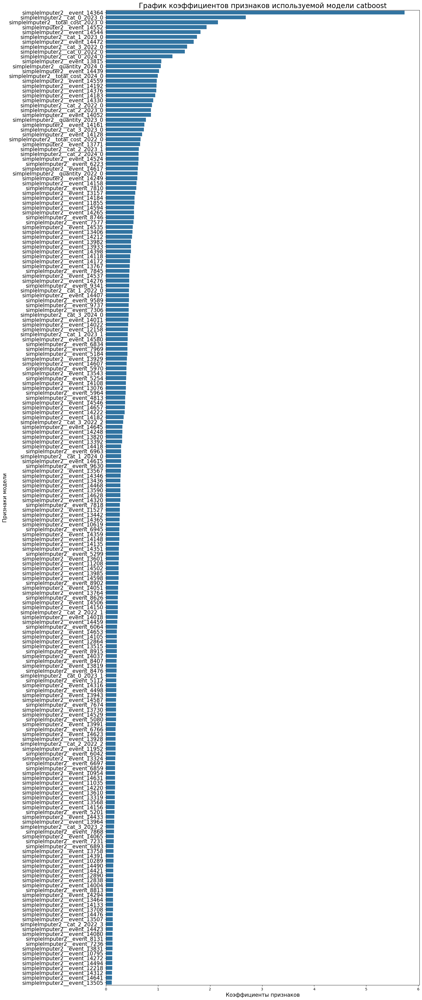

In [83]:

feature_importance = feature_importance.sort_values('Importance', ascending=False).head(200)

plt.figure(figsize=(16, 50))
ax = sns.barplot(x='Importance', y='Feature', data=feature_importance)
ax.set_title('График коэффициентов признаков используемой модели catboost', fontsize=20)
ax.set_xlabel('Коэффициенты признаков', fontsize=15)
ax.set_ylabel('Признаки модели', fontsize=15)
ax.set_yticklabels(feature_importance['Feature'], fontsize=15 )
plt.show()

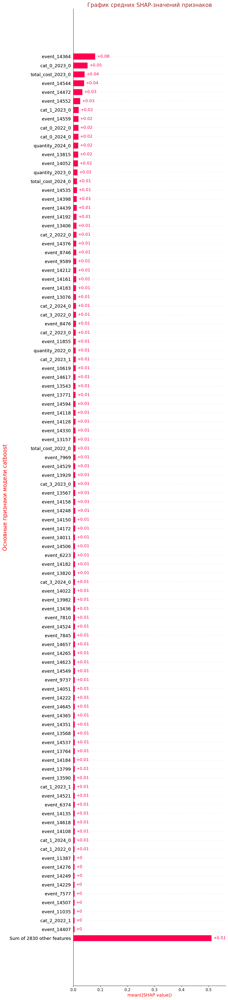

In [84]:
explainer = shap.TreeExplainer(pipeline.named_steps['model'])
shap_values = explainer(X_val, y_train)
#shap.plots.bar(shap_values[:,:,1], max_display=19)
plt.ylabel('Основные признаки модели catboost', color='red', fontsize=16);
plt.xlabel('Средние SHAP-значения признаков', color='red', fontsize=16);
plt.title('График средних SHAP-значений признаков', color='brown', fontsize=16);
shap.plots.bar(shap_values, max_display=100)

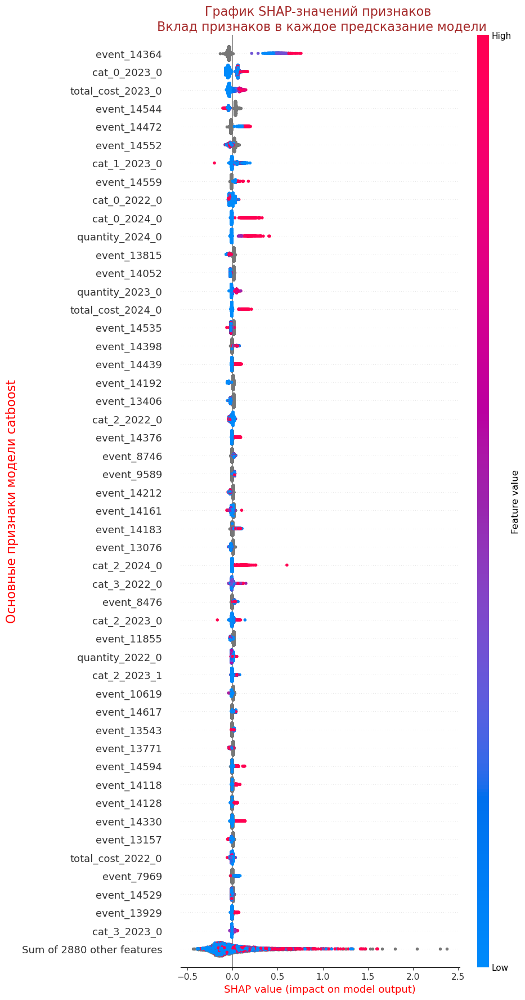

In [85]:
plt.ylabel('Основные признаки модели catboost', color='red', fontsize=16);
plt.xlabel('SHAP-значения признаков', color='red', fontsize=16);
plt.title('График SHAP-значений признаков \n Вклад признаков в каждое предсказание модели', color='brown', fontsize=16);
shap.plots.beeswarm(shap_values, max_display=50)

<div style="border:solid steelblue 3px; padding: 20px">
Основным влияющим входным признаком является рассылка 14364, далее идут рассылка 14472, 14389 и 14599, нулевая и первая подкатегория за 2023 и 2024г и общая стоимость покупкок за 2024г. Значимость рассылок кроме первой может меняться при новых обучениях модели новыми выборками. 

## Тестирование

In [86]:
y_pred = pipeline.predict(X_test)
preds = pipeline.predict_proba(X_test)
roc_auc_score(y_test, preds[:,1])

0.7613129363437879

## Общий вывод

<div style="border:solid steelblue 3px; padding: 20px">

В результате проделанной работы сделали предобработку данных, провели исследовательский анализ данных, по результатам которого выявили низкий коэффициент повторных покупок, резко выросшее количество мобильных рассылок и как следствие резко снизившуюся конверсию продаж,выявили рассылки, которые долее влияют на вероятность покупки,  разработали полезные признаки на основе существующих датасетов покупок и рассылок.Выбрали в качестве модели модель градиентного бустинга catboost. Получили список влияющих на вероятность покупки маркетинговых рассылок и добились метрики на тестовой выборке выше 0.73.
